create new inv name Regpro and install python and libaries 

# * review the data 
   ## pandas ( head , info, describe)
   ###  عند استعمال انفو يجب مراجعة نوع الداتا لكل عمود ومقارنتها مع الداتا فقد توجد اعمدة رقيمه ولان بها خلايا فارغة فتظهر على انها اعمده غير رقميه ,وعند تحويلها الى اعمده رقميه سوف تظهر هذه الخلايا الفارغه عند اعادة استعمال انفو  او مثلا لو بها تاريخ فيجب تحويله 
# * data viualization 
   ## pandas ( plot ( kind = bar) , hist ) or seaborn.countplot
   ## seaborn(relplot) or matplotlib( scatter )
# * data processing 
   ## 0 - add new features ( optional )
   ## 1 - split 
   ## 2 - for numerical columns 
   ### ** impute 
   #### fit on X_train 
   #### transform on X_trian, X_test and X_vald
   ### ** normalization or standardization 
   #### fit on X_train 
   #### transform on X_trian, X_test and X_vald
   ## 3 - for categorical columns 
   ### ** impute 
   #### fit on X_train 
   #### transform on X_trian, X_test and X_vald
   ### ** one hot encoding
   #### fit on X_train 
   #### transform on X_trian, X_test and X_vald
   

# conda create --name Regpro
# conda install python 
# conda install notebook
# pip install -r filepath\filename.txt     
# ملف حاهز به اسماء جميع المكتبات عشان ننزلها مره واحده 
#  هناك مكتبات تنزل بشكل تلقائى مع مكتبات اخرى 
# سوف يظهر هنا  notebook\ Regpro
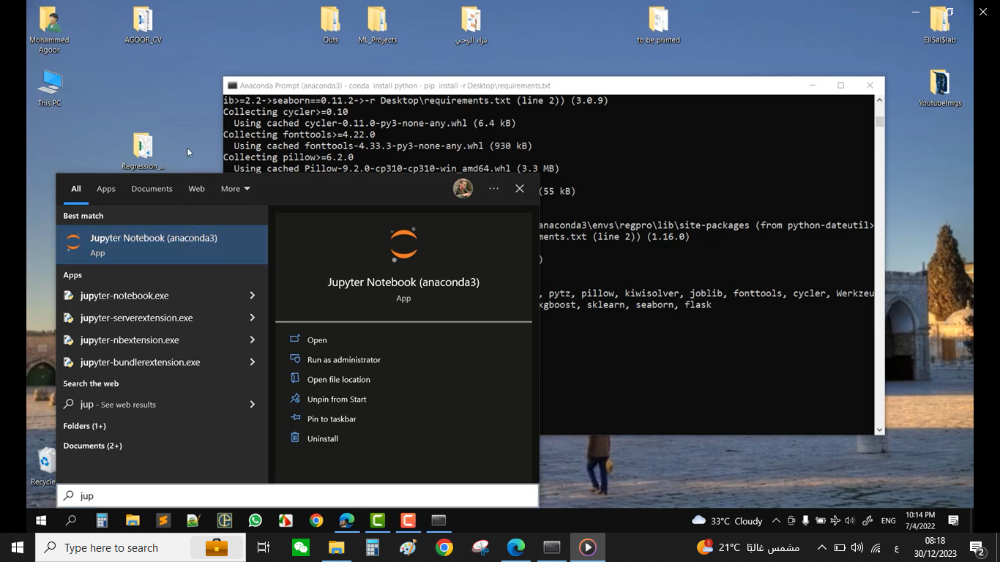

# open note form the same location at where the data.csv found 

### Import the main Libraries

In [1]:
## Most Important 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## other
import missingno as msno
import os

## Model Selection
from sklearn.model_selection import (train_test_split , cross_val_score, cross_val_predict,
        GridSearchCV, RandomizedSearchCV)

## Metrics
from sklearn.metrics import mean_squared_error, r2_score

## Preprocessing 
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, PolynomialFeatures
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn_features.transformers import DataFrameSelector

## Models
from sklearn.linear_model import LinearRegression, SGDRegressor, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor


# install missingno
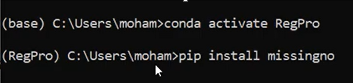

### Load the Data ana Look at the big picture

In [2]:
os.getcwd()

'C:\\Users\\hmohammad\\Desktop\\udacity\\machine_learning\\learining_machine_video_corses\\m_agoor\\AI\\labs'

In [3]:
file_path = os.path.join(os.getcwd(), 'housing.csv')

In [4]:
## Read the csv file using pandas

df_housing = pd.read_csv(file_path)
print(df_housing.shape)
## show the head of the DF
df_housing.sample(10)

(20640, 10)


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
12616,-121.55,38.51,14.0,5490.0,851.0,2415.0,837.0,6.5253,216800.0,INLAND
7617,-118.24,33.85,25.0,9594.0,1489.0,5237.0,1496.0,5.9684,193300.0,<1H OCEAN
7056,-118.03,33.92,35.0,2108.0,405.0,1243.0,394.0,3.6731,167000.0,<1H OCEAN
18862,-122.21,38.11,31.0,2766.0,604.0,1441.0,552.0,3.1768,131000.0,NEAR BAY
8929,-118.48,34.01,31.0,1829.0,458.0,719.0,392.0,4.4000,353800.0,<1H OCEAN
9001,-118.34,33.99,47.0,1107.0,199.0,437.0,178.0,3.7344,179400.0,<1H OCEAN
11622,-118.04,33.82,26.0,4105.0,637.0,2072.0,648.0,5.8440,273900.0,<1H OCEAN
2079,-119.81,36.75,52.0,1827.0,356.0,855.0,353.0,1.7636,55100.0,INLAND
10845,-117.89,33.68,26.0,2905.0,504.0,1452.0,491.0,5.0853,260300.0,<1H OCEAN
17658,-121.90,37.28,34.0,4613.0,749.0,2050.0,725.0,5.3922,302900.0,<1H OCEAN


In [5]:
df_housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [6]:
## check the info (nulls and datatypes)
df_housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [133]:
df_housing['ocean_proximity'].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [7]:
# note total_bedrooms 20433 non-null not 20640 that is mean there is nuls 
# all columns are float except ocean_proximity is object 

In [8]:
## some statistics of the DF --> target column is (median_house_value)
df_housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [9]:
# to check nuls ( true = there is or yes ,  false = no )
df_housing.isna()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
20635,False,False,False,False,False,False,False,False,False,False
20636,False,False,False,False,False,False,False,False,False,False
20637,False,False,False,False,False,False,False,False,False,False
20638,False,False,False,False,False,False,False,False,False,False


In [10]:
## check the nulls
df_housing.isna().sum()  # .sum(axis = 0)

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

* > `Comment: It seems that Dataset is a contains 20640 instances and only 207 null values in total_bedrooms feature, and also all datatypes is float64 as they are continuous numerical features except the (ocean_proximity) column which is nominal categorical Feature` 

# using missingno 
## Missingno library offers a very nice way to visualize the distribution of NaN values. Missingno is a Python library and compatible with Pandas.

<Axes: >

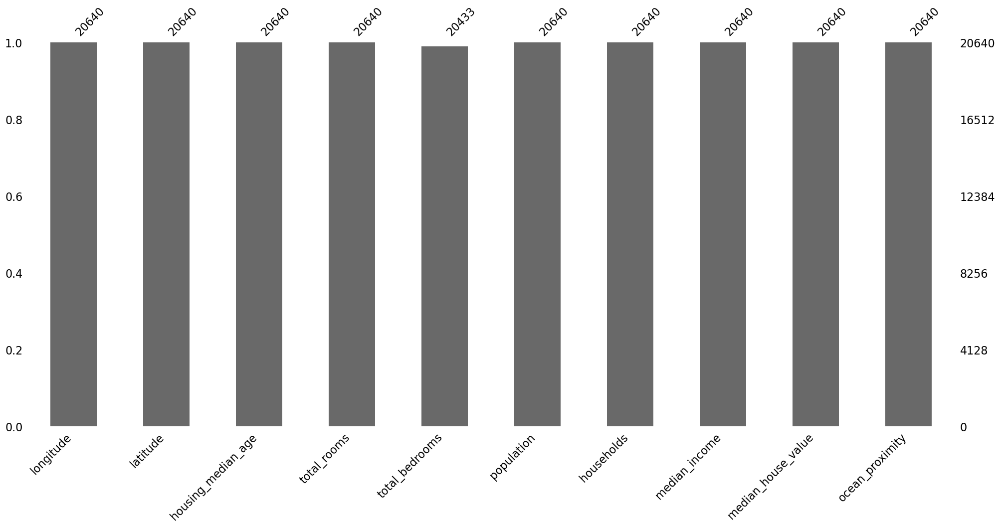

In [11]:
msno.bar(df_housing)

# msno.matrix(df_housing) 
not working may be because the version of missingno the figure should be like this photo
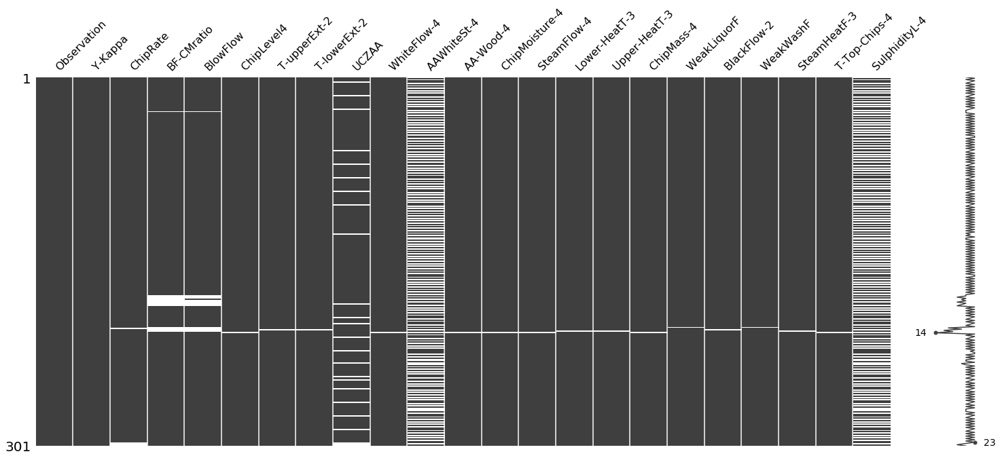

In [12]:
msno.__version__  

'0.4.2'

### Exploratory Data Analysis (EDA)

### `Univariate Visualization`   make a visualization on one variable 

In [13]:
df_housing['ocean_proximity']

0        NEAR BAY
1        NEAR BAY
2        NEAR BAY
3        NEAR BAY
4        NEAR BAY
           ...   
20635      INLAND
20636      INLAND
20637      INLAND
20638      INLAND
20639      INLAND
Name: ocean_proximity, Length: 20640, dtype: object

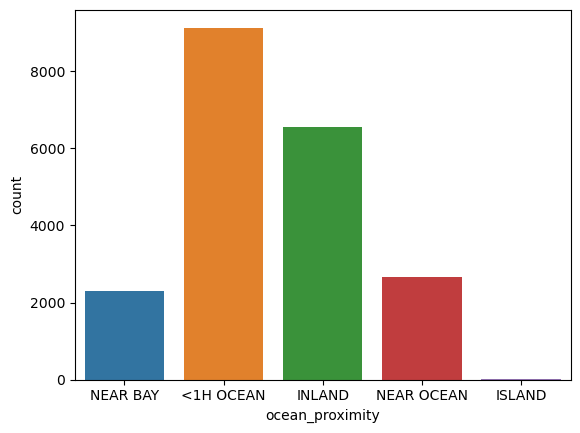

In [14]:
sns.countplot(x = 'ocean_proximity', data = df_housing);

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64
##############################
Index(['<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'NEAR BAY', 'ISLAND'], dtype='object', name='ocean_proximity')
##############################
[9136 6551 2658 2290    5]
##############################
20640
##############################
Index(['<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'NEAR BAY', 'ISLAND'], dtype='object', name='ocean_proximity')


<Axes: xlabel='ocean_proximity', ylabel='count'>

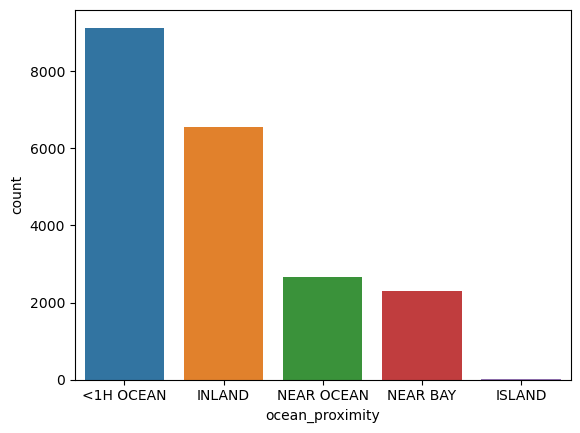

In [15]:
# can make an order using code instead of list 
print(df_housing["ocean_proximity"].value_counts())
print('##############################')
print(df_housing["ocean_proximity"].value_counts().keys())
print('##############################')
print(df_housing["ocean_proximity"].value_counts().values)
print('##############################')
print(df_housing["ocean_proximity"].value_counts().sum())
print('##############################')
print(df_housing["ocean_proximity"].value_counts().index)
sns.countplot(x = 'ocean_proximity', data = df_housing, order=df_housing["ocean_proximity"].value_counts().keys())
# above line could use index instead of keys()==>  df_housing, order=df_housing["ocean_proximity"].value_counts().index())

#  note the way to write text format  
## f'{ocean_counts.values[i]/ocean_counts.sum()*100 : .3f} %'
### : .2f inside the {}

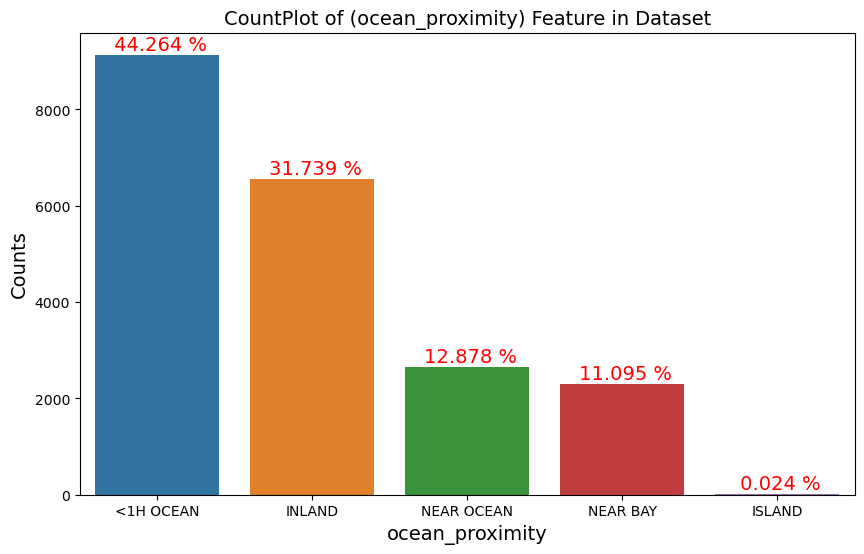

In [16]:
ocean_counts = df_housing["ocean_proximity"].value_counts()
plt.figure(figsize=(10, 6))
sns.countplot(x = 'ocean_proximity', data = df_housing, order=ocean_counts.keys())
plt.title('CountPlot of (ocean_proximity) Feature in Dataset', fontsize=14, c='k')
plt.xlabel('ocean_proximity', fontsize=14, c='k') # no need for this code seaborn do auto
plt.ylabel('Counts', fontsize=14, c='k')  # no need for this code seaborn do auto
## showing the percenatge

for i in range(5):
    txt = f'{ocean_counts.values[i]/ocean_counts.sum()*100 : .3f} %'
#     txt='{:0.2f}%'.format(100*count / df_housing.shape[0])
    count = ocean_counts.values[i]
    plt.text(i, count +100 , txt, ha='center', fontsize = 14, c="r" )

# pandas is more easy with bar plot than matplotlib and seaborn 
## ( orderd auto ) but not colored 

In [17]:
df_housing["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

<Axes: xlabel='ocean_proximity'>

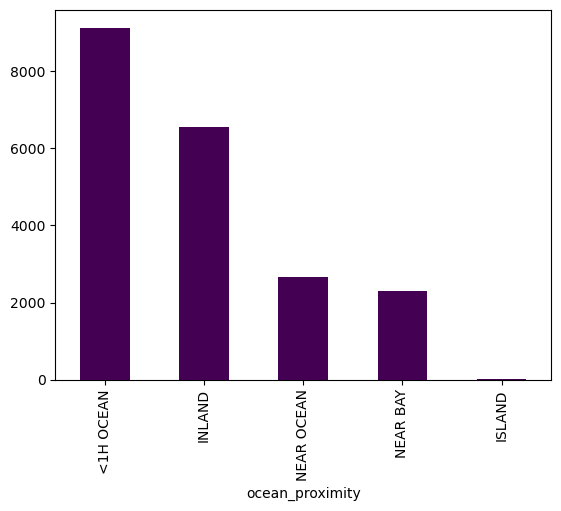

In [18]:
df_housing["ocean_proximity"].value_counts().plot(kind='bar', cmap='viridis')


In [19]:
dd = df_housing[df_housing['ocean_proximity'] == '<1H OCEAN'] 
dd.head(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
701,-121.97,37.64,32.0,1283.0,194.0,485.0,171.0,6.0574,431000.0,<1H OCEAN
830,-121.99,37.61,9.0,3666.0,711.0,2341.0,703.0,4.6458,217000.0,<1H OCEAN
859,-121.97,37.57,21.0,4342.0,783.0,2172.0,789.0,4.6146,247600.0,<1H OCEAN
860,-121.96,37.58,15.0,3575.0,597.0,1777.0,559.0,5.7192,283500.0,<1H OCEAN
861,-121.98,37.58,20.0,4126.0,1031.0,2079.0,975.0,3.6832,216900.0,<1H OCEAN
862,-121.99,37.58,31.0,2878.0,478.0,1276.0,485.0,6.2073,282500.0,<1H OCEAN
863,-122.00,37.58,6.0,4405.0,717.0,2071.0,688.0,5.8151,295600.0,<1H OCEAN
870,-121.93,37.49,5.0,1150.0,311.0,648.0,245.0,3.5714,300000.0,<1H OCEAN
880,-121.99,37.56,18.0,5505.0,1005.0,2641.0,971.0,5.0000,269700.0,<1H OCEAN
881,-121.99,37.56,20.0,6462.0,1294.0,3288.0,1235.0,4.3393,231200.0,<1H OCEAN


# to remove < form <1H OCEAN using replace method ( old value, new value ) 

In [20]:
df_housing['ocean_proximity'] = df_housing['ocean_proximity'].replace('<1H OCEAN', '1H OCEAN')
# to check if it working or not
print(df_housing['ocean_proximity'].unique())  # using pandas
# it working 
np.unique(df_housing['ocean_proximity']) # using numpy

['NEAR BAY' '1H OCEAN' 'INLAND' 'NEAR OCEAN' 'ISLAND']


array(['1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
      dtype=object)

<function matplotlib.pyplot.show(close=None, block=None)>

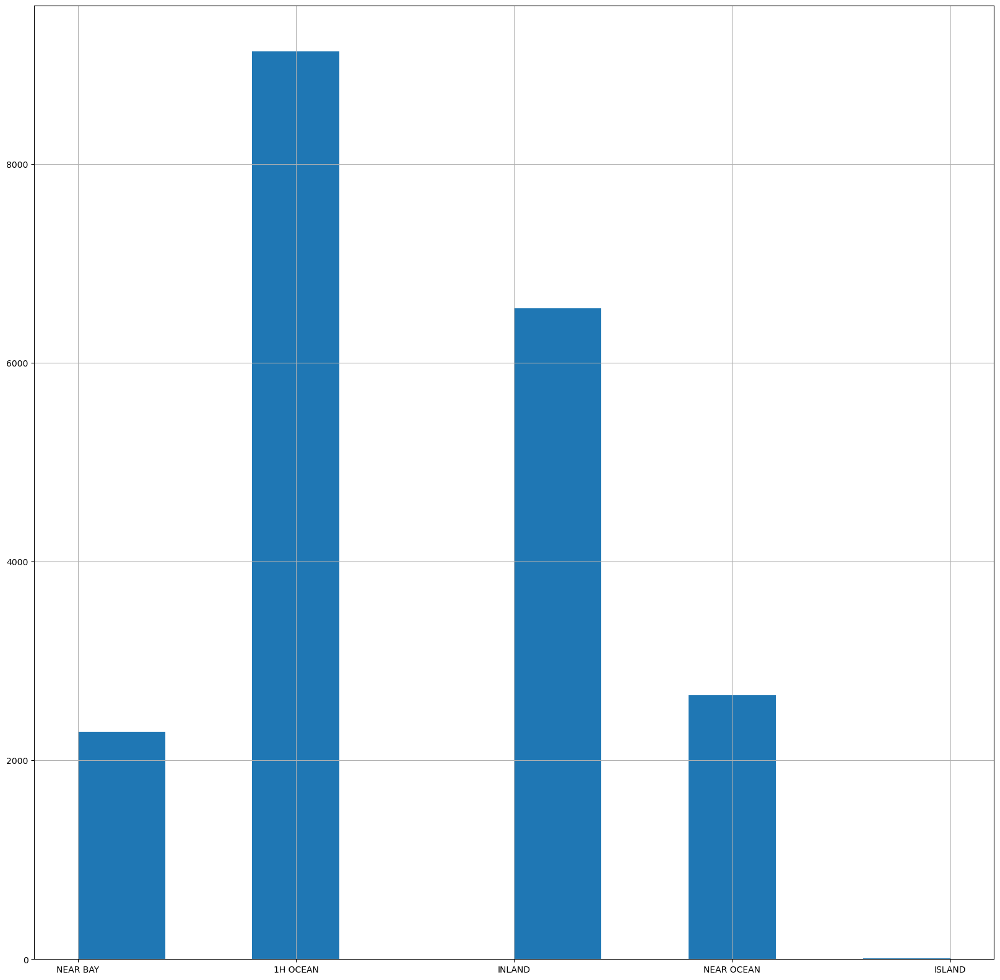

In [21]:
df_housing['ocean_proximity'].hist(bins=10, figsize= (20,20))
plt.show

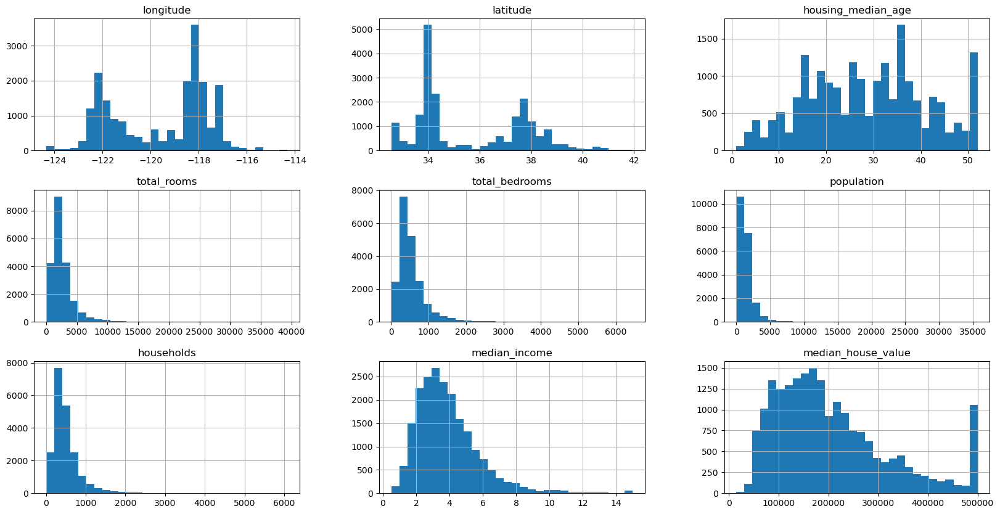

In [22]:
## Histogram Distribution of Numerical Variables in Dataset
df_housing.hist(bins=30, figsize=(20,10))
plt.show()

# scatte plot with important features (median_income) with the target (median_house_value) 
1 -  using seaborn, 
2- using matplotlib

Text(0.5, 1.0, 'Distribution of median income with house value')

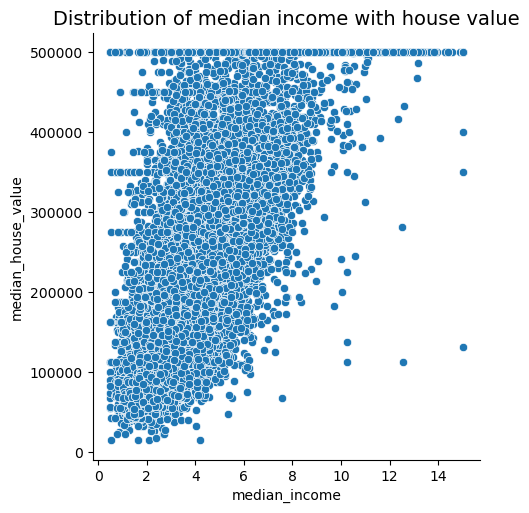

In [23]:
sns.relplot(x = 'median_income', y = 'median_house_value', data = df_housing )
plt.title('Distribution of median income with house value', fontsize=14, c='k')

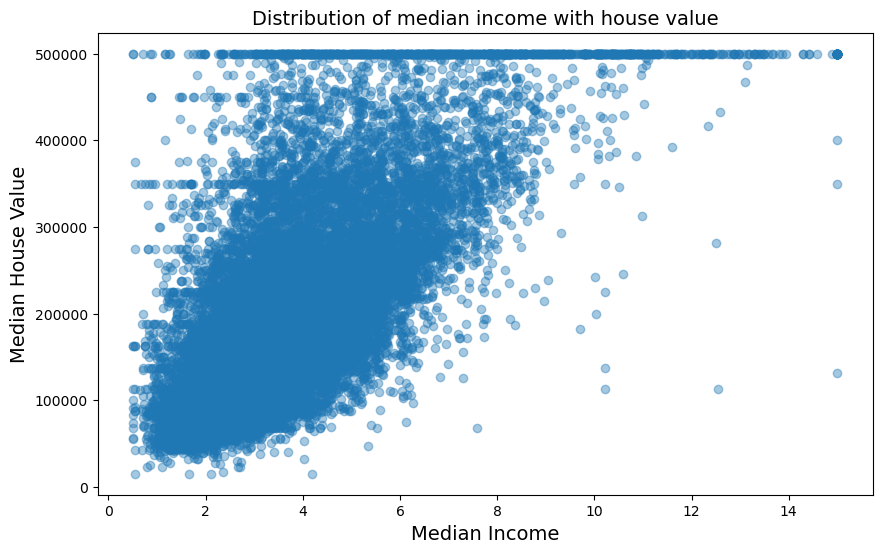

In [24]:
## scatte plot with important features (median_income) with the target (median_house_value)
plt.figure(figsize=(10, 6))
plt.scatter(df_housing['median_income'], df_housing['median_house_value'], alpha=0.4)
plt.title('Distribution of median income with house value', fontsize=14, c='k')
plt.xlabel('Median Income', fontsize=14, c='k')
plt.ylabel('Median House Value', fontsize=14, c='k')
plt.show()

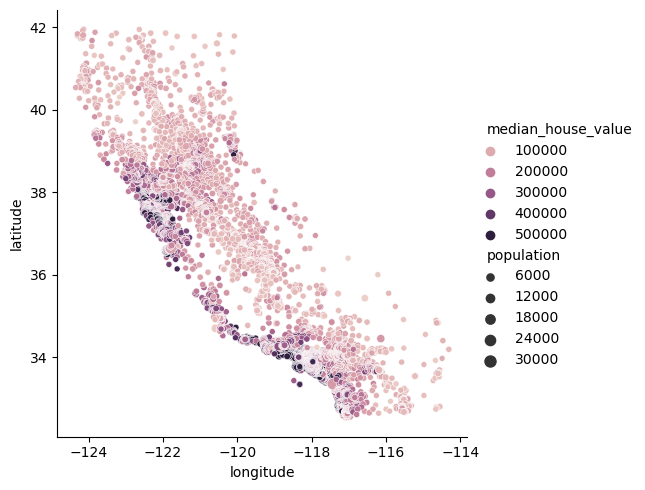

In [14]:
sns.relplot(x= 'longitude' , y= 'latitude',  data= df_housing,
            hue='median_house_value' , size = 'population')

In [ ]:
sc = plt.scatter(x=df_housing['longitude'], y=df_housing['latitude'], 
                 s=df_housing['population']/100, c=df_housing['median_house_value'], 
                 cmap=plt.get_cmap('jet'), label='Population')

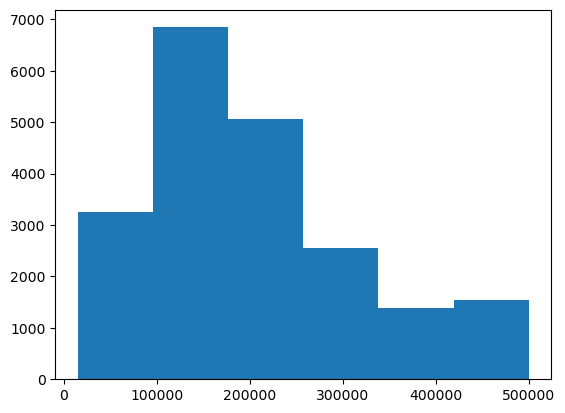

In [25]:
plt.hist(df_housing['median_house_value'], bins=6);

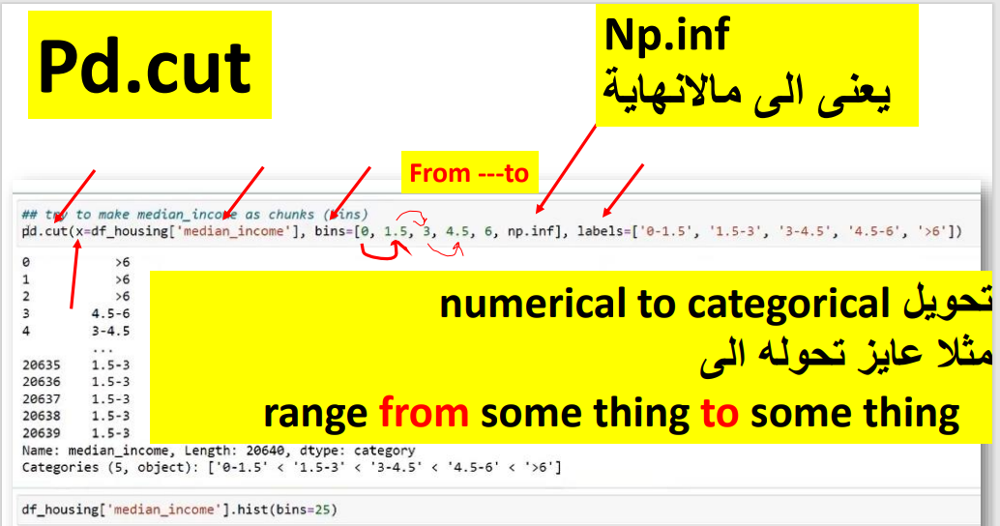

C:\Users\hmohammad\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


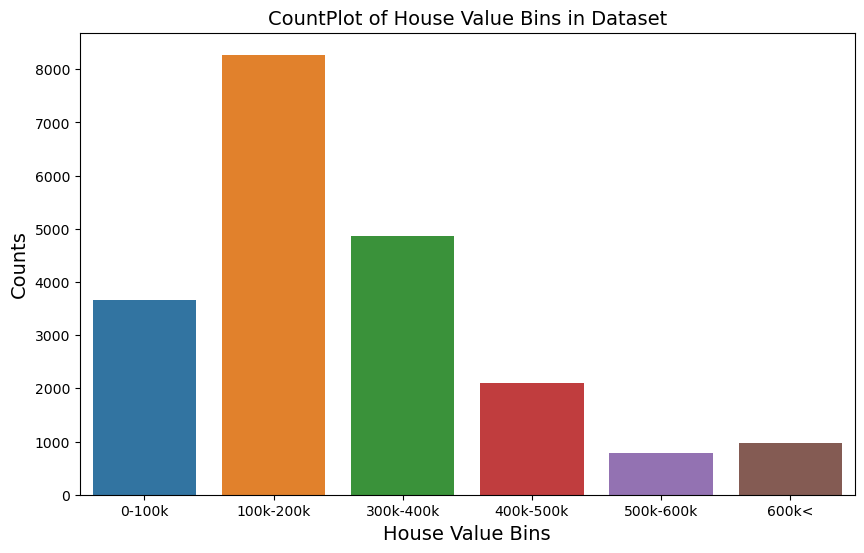

In [26]:
## Try for (median_house_value) to convert it to chunks (bins)
## Cut this numerical feature to categorical for its values to be in range will be in the same category
## In the following example -- any value between range (0-100k) will be the same category, I name it (0-100k)
house_value_bins = pd.cut(x=df_housing['median_house_value'], 
                          bins=[0, 100000, 200000, 300000, 400000, 500000,np.inf], 
                          labels=['0-100k', '100k-200k', '300k-400k', '400k-500k', '500k-600k', '600k<'])

## countplot for the above chunks
plt.figure(figsize=(10, 6))
sns.countplot(x=house_value_bins)
plt.title('CountPlot of House Value Bins in Dataset', fontsize=14, c='k')
plt.xlabel('House Value Bins', fontsize=14, c='k')
plt.ylabel('Counts', fontsize=14, c='k')
plt.show()

C:\Users\hmohammad\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


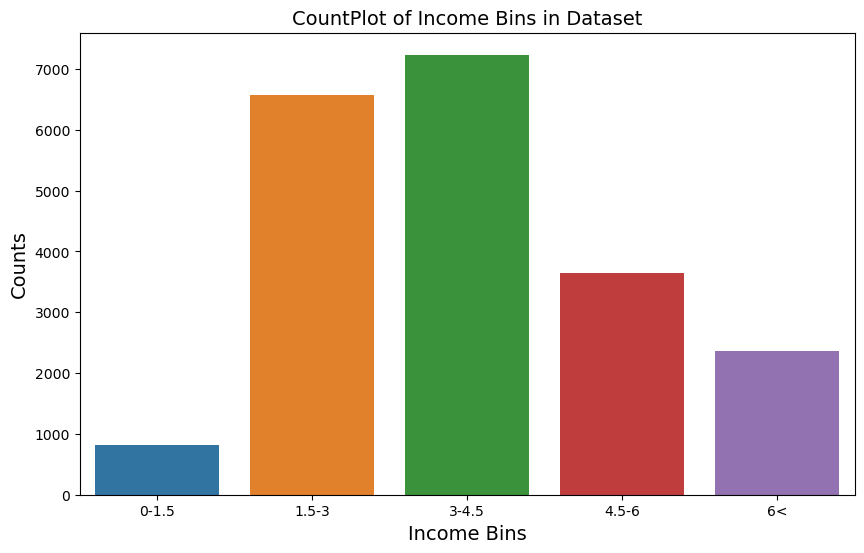

In [27]:
## Let's try the same above code for (median_income), I think it is very important feature
income_bins = pd.cut(x=df_housing['median_income'], 
                          bins=[0, 1.5, 3, 4.5, 6, np.inf],
                          labels=['0-1.5', '1.5-3', '3-4.5', '4.5-6', '6<'])

## countplot for the above chunks
plt.figure(figsize=(10, 6))
sns.countplot(x=income_bins)
plt.title('CountPlot of Income Bins in Dataset', fontsize=14, c='k')
plt.xlabel('Income Bins', fontsize=14, c='k')
plt.ylabel('Counts', fontsize=14, c='k')
plt.show() 

# Comment:
## * It seems that the (<1H ocean) is about the half of the dataset the data is biased to this category, someone can think to split the data according to this column using (startified) method if we found that this column is very important, we will discuss that later,
## * Also, it seems that the Distribution of most of features are right skewed (exponential distribution) and it is known that the best distribution to be passed to the model is Normal Distribution, 
## * we will go further with these features to know how to deal with these skewed distrbution later, 
## * Also the majority of house_value is between (100k-200k), Also the majority of median_income is between (3-4.5), someone can change his mind and split the dataset using (startified) method according to the most important feature as I think till now which is (median_income) 
# but use (income_bins) as the stratified method requires categorical features not numerical` 
# بعض الاعمده بها بايس باتجاه معين واذا تم تقسيم الداتا بطريقة عشوائية الى تدريب واختبار فقد تقع بعض الفئات كلها فى عينة التدريب ولايوجد منها شئ فى عينة الاختبار ولذا يرعى عند تقسيم الداتا ان تتم بطريقة نحافظ بها على النسبه بين الداتا فى كل عمود  

### `Bivariate Visualization`
# العلاقة بين ثلاثة مغيرات  

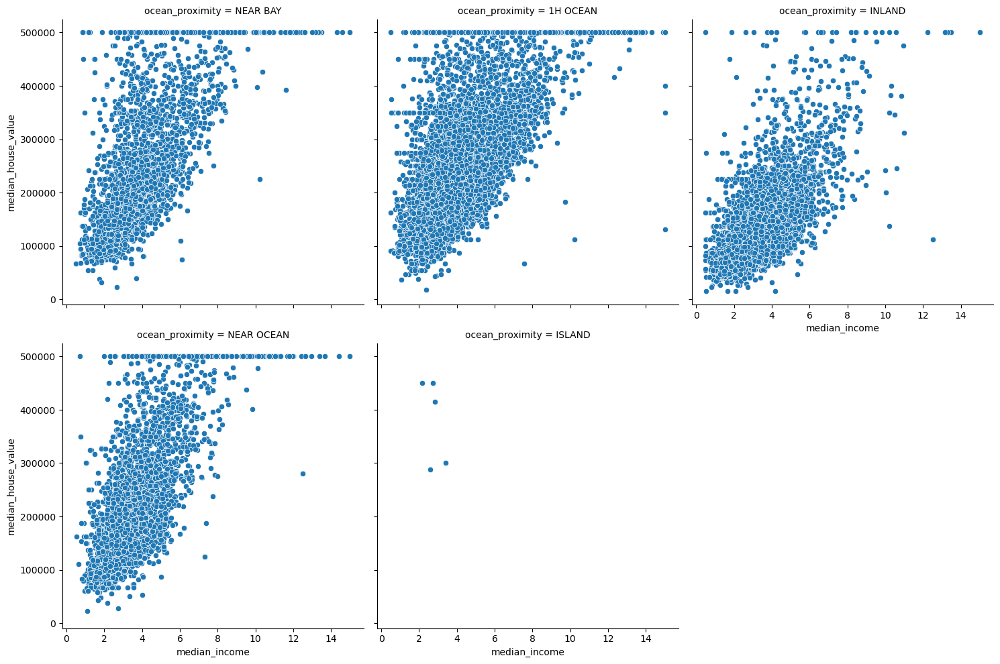

In [28]:
## Scatter plot with (median_income) and (median_house_value) at each (ocean_proximity) 
sns.relplot(x='median_income', y='median_house_value', data=df_housing, kind='scatter', 
            col='ocean_proximity', col_wrap=3)
plt.show()

# نلاحظ من الرسم السابق  ان العلاقة بين 
median income  and median house value  
لا تتاثر باختلاف المناطق الموجوده فى العمود 
ocean proximity 


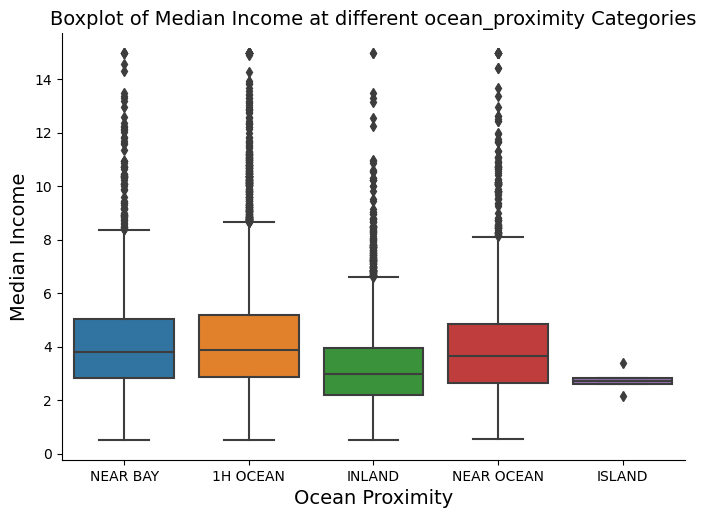

In [29]:
## Check the Boxplot of the (median_income) at different categories of (ocean_proximity)
sns.catplot(y='median_income', x='ocean_proximity', data=df_housing, kind='box', height=5, aspect=1.4)
plt.title('Boxplot of Median Income at different ocean_proximity Categories', fontsize=14, c='k')
plt.xlabel('Ocean Proximity', fontsize=14, c='k')
plt.ylabel('Median Income', fontsize=14, c='k')
plt.show()

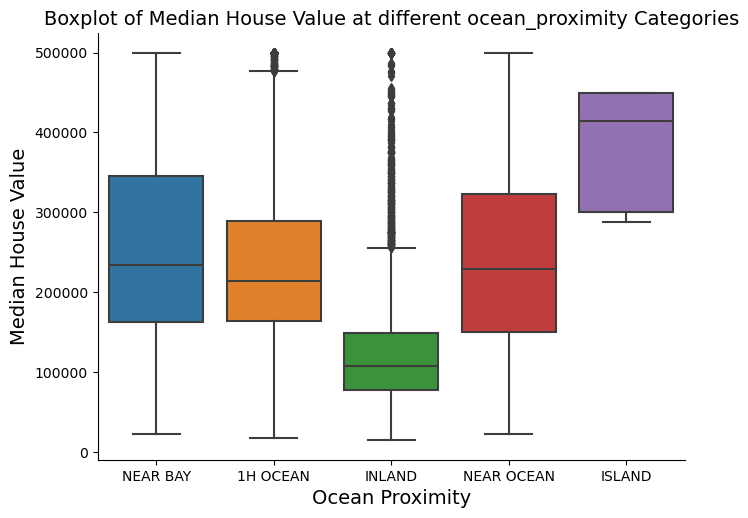

In [30]:
## Check the Boxplot of the (median_house_value) at different categories of (ocean_proximity)
sns.catplot(y='median_house_value', x='ocean_proximity', data=df_housing, kind='box', height=5, aspect=1.4)
plt.title('Boxplot of Median House Value at different ocean_proximity Categories', fontsize=14, c='k')
plt.xlabel('Ocean Proximity', fontsize=14, c='k')
plt.ylabel('Median House Value', fontsize=14, c='k')
plt.show()

* > `Comment: It seems that the Distribution of median_income is almost the same at ocean_proximity categories, Also, it seems that the INLAND median_income and median_house value is less than other categories and it makes sense ` 

### `Multivariate Visualization`

#  العلاقة بين اكثر من ثلاثة متغيرات 
1 - using seaborn
2 - using matplotlib


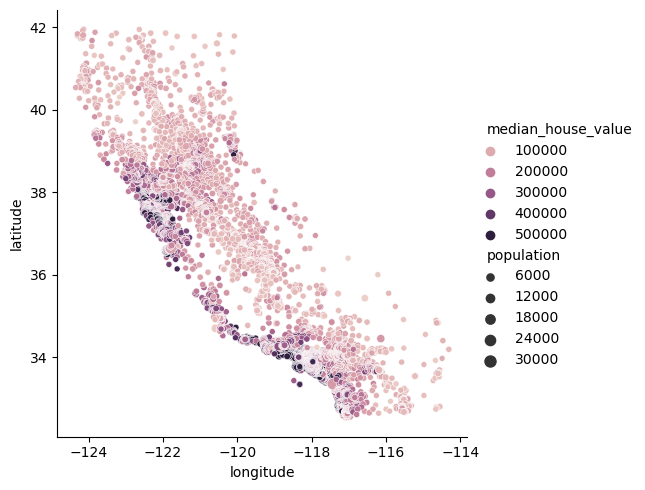

In [31]:
# using seaborn 
sns.relplot(x= 'longitude' , y= 'latitude' , data= df_housing , size= 'population',
            hue= 'median_house_value');

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


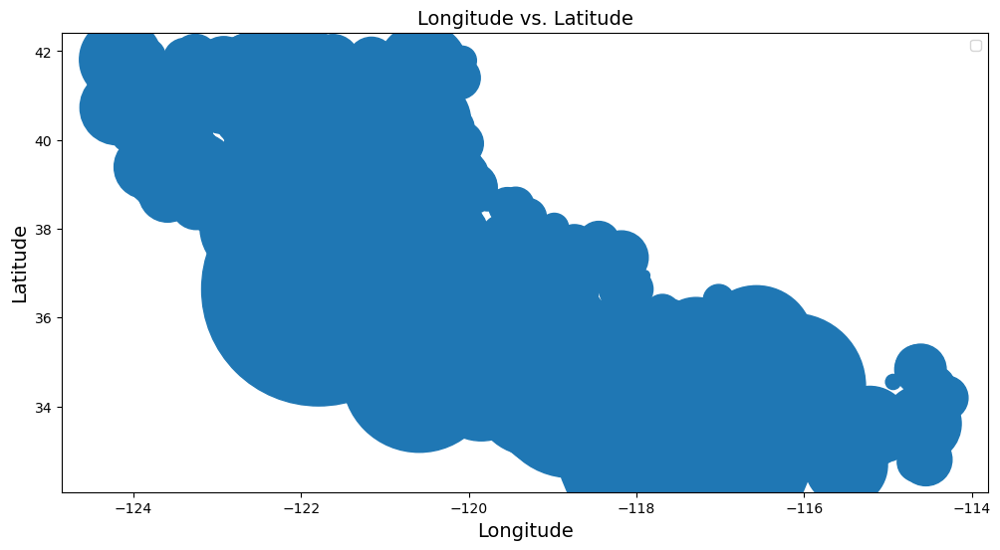

In [32]:
# using matplotlib
plt.figure(figsize=(12, 6))
sc = plt.scatter(df_housing['longitude'], df_housing['latitude'], s=df_housing['population'])

plt.xlabel('Longitude', fontsize=14, c='k')
plt.ylabel('Latitude', fontsize=14, c='k')
plt.title('Longitude vs. Latitude', fontsize=14, c='k')
plt.legend()
plt.show()

# نقسم على 100

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


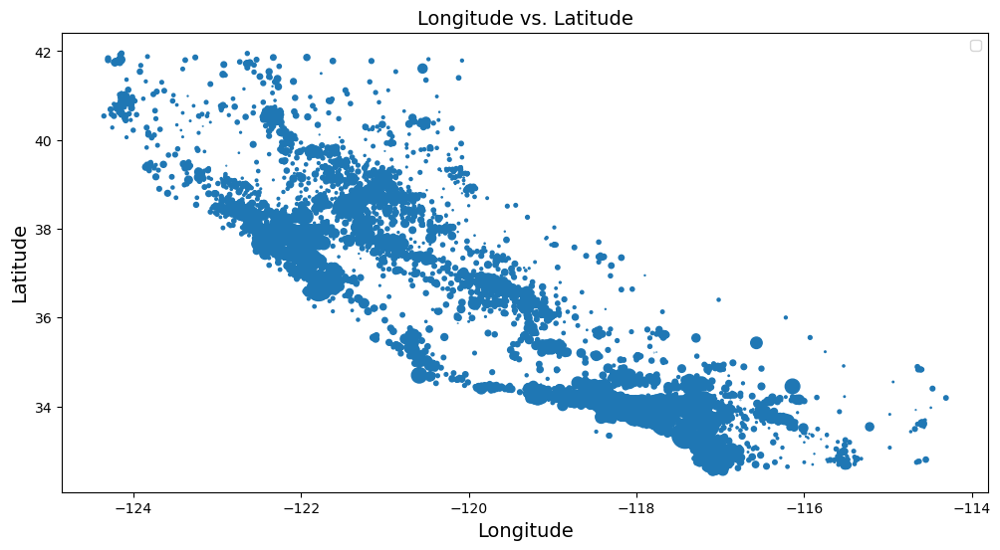

In [33]:
plt.figure(figsize=(12, 6))
sc = plt.scatter(df_housing['longitude'], df_housing['latitude'], s=df_housing['population']/100)

plt.xlabel('Longitude', fontsize=14, c='k')
plt.ylabel('Latitude', fontsize=14, c='k')
plt.title('Longitude vs. Latitude', fontsize=14, c='k')
plt.legend()
plt.show()

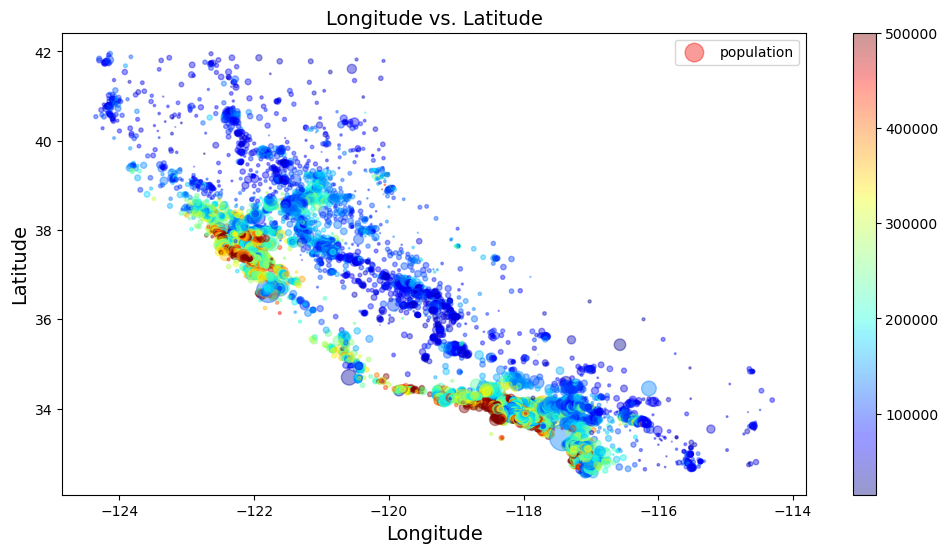

In [34]:
## Scatter plot for (longitued & latitued), and add population as the size of the point and the color as (house_value)
plt.figure(figsize=(12, 6))
sc = plt.scatter(df_housing['longitude'], df_housing['latitude'], s=df_housing['population']/100,
                   alpha=0.4, c=df_housing['median_house_value'], cmap=plt.get_cmap('jet'), label='population')
#  c=df_housing['median_house_value'] شدة غماقة اللون تدل على ارتفاع قيمة هذا العمود 
# لاحظ انه تم تسميها باسم لاستخدامها لاحقا 
plt.colorbar(sc)
plt.xlabel('Longitude', fontsize=14, c='k')
plt.ylabel('Latitude', fontsize=14, c='k')
plt.title('Longitude vs. Latitude', fontsize=14, c='k')
plt.legend()
plt.show()

* > `Comment: IIt seems that prices is higher near the ocean than other zones, and also these araes have higher population` 

### `Check the Correlation between the Features and the Target`

In [35]:
df_housing.corr()

ValueError: could not convert string to float: 'NEAR BAY'

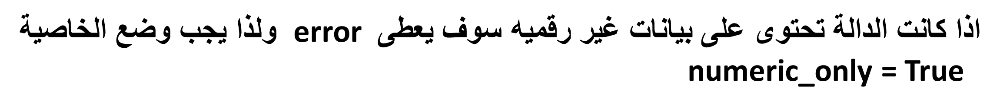

In [ ]:
df_housing.corr(numeric_only=True)

# الطريقة الثانيه ان نختار الاعمدة الرقميه فقط ونعرفها باسم جديد للداتا ونشتغل عليها

In [36]:
df_housing.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [37]:
df = df_housing[['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income' ,
       'median_house_value' ]]

In [38]:
df.corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


In [39]:
df_housing.corr(numeric_only= True)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


In [40]:
df_housing.corr(numeric_only= True)['median_house_value']
#     مهمة جدا هذه الخطوه لمعرفة ايا من الفيت شرز له تأثير كبير على التارجت 

longitude            -0.045967
latitude             -0.144160
housing_median_age    0.105623
total_rooms           0.134153
total_bedrooms        0.049686
population           -0.024650
households            0.065843
median_income         0.688075
median_house_value    1.000000
Name: median_house_value, dtype: float64

In [41]:
df_housing.corr(numeric_only= True)['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

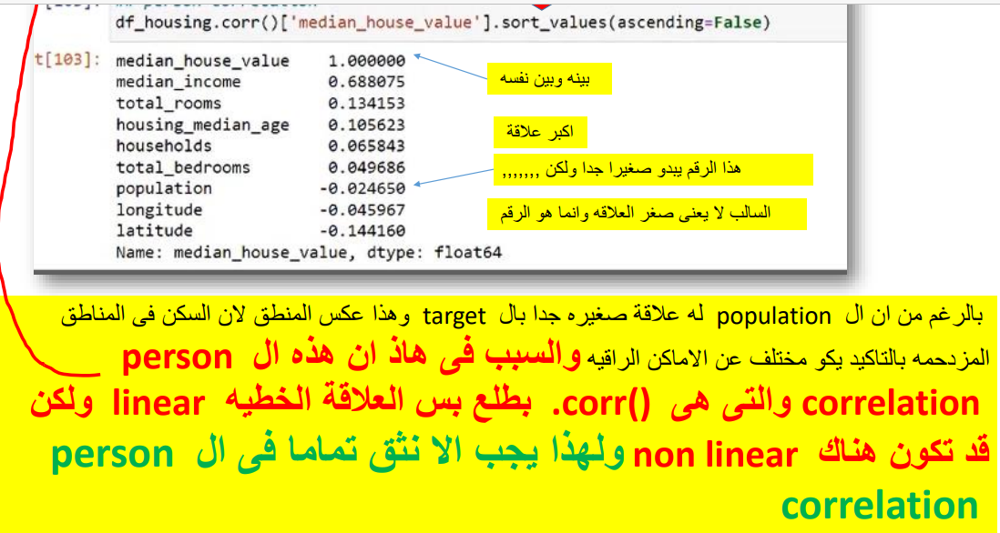

from scipy.stats import spearmanr
### get correlation coefficeint but using (spearmanr) to handle non linearity of correlation
coef_corr_spear, p_value_spear = spearmanr(X_train_set_final.iloc[:,:3], y_train_set_final)


### for correlation coeffiecnt
coef_corr_spear = pd.DataFrame(coef_corr_spear,
                              columns=['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn'])

#### almost the same as perason correlation
plt.figure(figsize=(8, 4))
sns.heatmap(coef_corr_spear, annot=True, cbar=False)   ## spearmanr correlation
plt.title('spearmanr correlation');

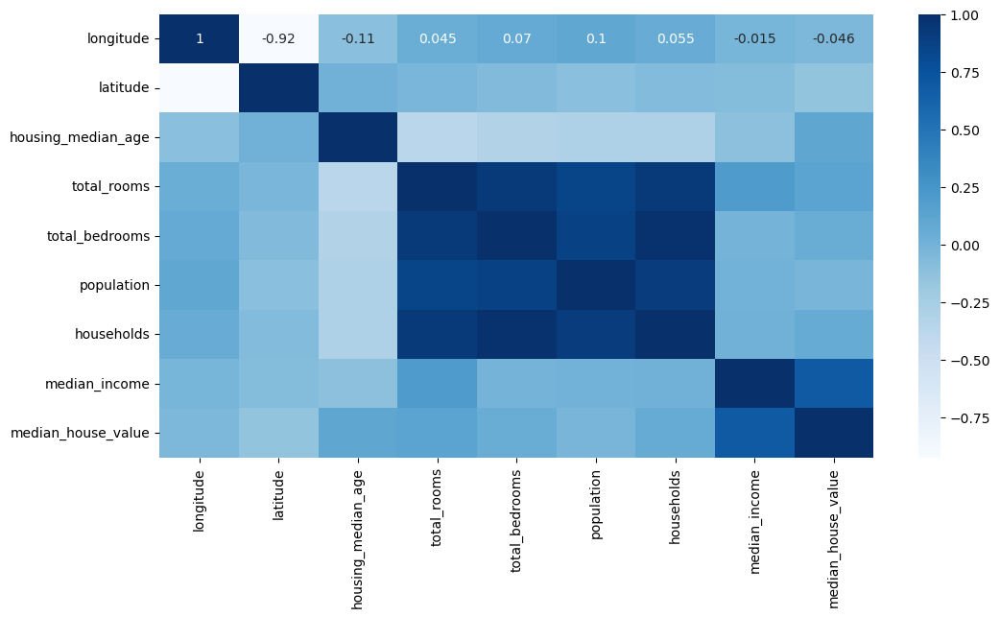

In [42]:
## you can show this as heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df_housing.corr(numeric_only=True), annot=True, cmap='Blues')  ## symmetric matrix
plt.show()

* > `Comment: It seems that the most correlated Feature with target is (median_income) as I predict that, and feature like (households & population) are less correlated` 

### Feature Engineering
`Try to add some features, thinking that it will be more useful and more correlated to the target`
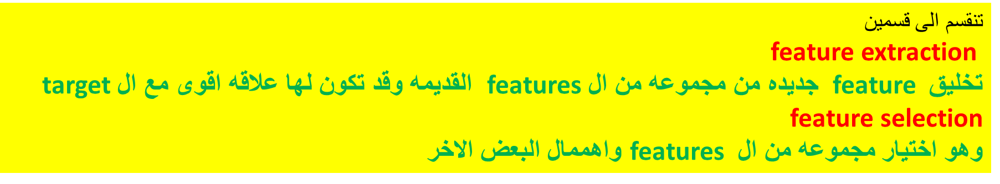

In [43]:
## Try to make some Feature Engineering --> Feature Extraction --> Add the new column to the main DF
df_housing['rooms_per_household'] = df_housing['total_rooms'] / df_housing['households']
df_housing['bedroms_per_rooms'] = df_housing['total_bedrooms'] / df_housing['total_rooms']
df_housing['population_per_household'] = df_housing['population'] / df_housing['households']

In [44]:
## check the correlation again
df_housing.corr(numeric_only=True)['median_house_value'].sort_values(ascending=False)  ## some progress for out new features (very good)

median_house_value          1.000000
median_income               0.688075
rooms_per_household         0.151948
total_rooms                 0.134153
housing_median_age          0.105623
households                  0.065843
total_bedrooms              0.049686
population_per_household   -0.023737
population                 -0.024650
longitude                  -0.045967
latitude                   -0.144160
bedroms_per_rooms          -0.255880
Name: median_house_value, dtype: float64

* > `Comment:Some progress for out new features (very good), Strong correlation` 

In [45]:
df_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,rooms_per_household,bedroms_per_rooms,population_per_household
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,6.984127,0.146591,2.555556
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,6.238137,0.155797,2.109842
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,8.288136,0.129516,2.802260
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,5.817352,0.184458,2.547945
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,6.281853,0.172096,2.181467
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,5.045455,0.224625,2.560606
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,6.114035,0.215208,3.122807
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,5.205543,0.215173,2.325635
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,5.329513,0.219892,2.123209


### `Split the Dataset`
`I will split the Dataset using ordinary method (random method) not (Stratified method)`

In [46]:
# using pop() method 
# y = df_housing.pop('median_house_value')
# y

In [47]:
# X = df_housing
# X

In [48]:
## Split the Whole dataset to features and target
X = df_housing.drop(columns=['median_house_value'], axis=1)  ## features
y = df_housing['median_house_value']  ## target

## هذه الطريقة فى التقسيم غير مفضله فى حالة ال 
## machine linerning 
##  ويفضل استعمال ال  
## cross validation 
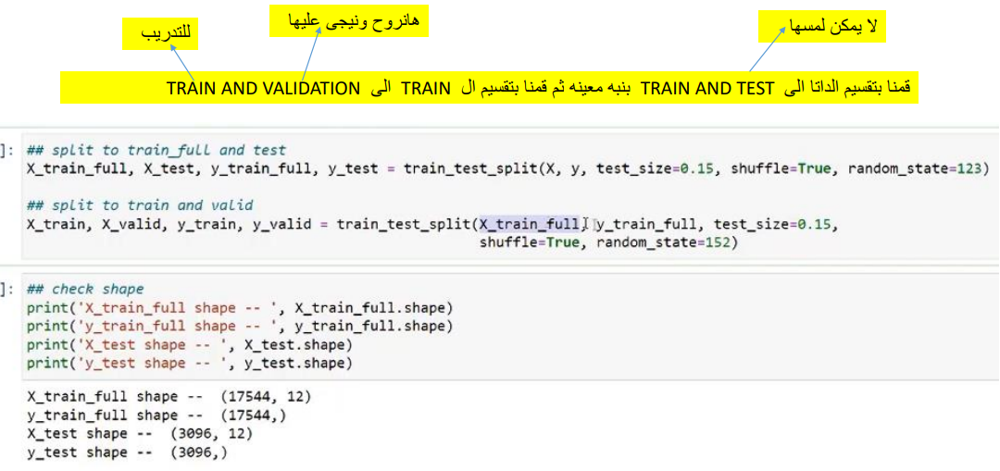

-------

In [49]:
# ## Random split the dataset to two sets (train_set, valid_set, test_set)
# ## Firstly split to (train_full_set, test_set) then split (train_full_set) to (train_set, valid_set)
# ## Firstly
# X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.15, random_state=123, shuffle=True)
# ## secondly
# X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, test_size=0.2, random_state=125, shuffle=True)

# ## check shape
# print('X_train shape -- ', X_train.shape)
# print('y_train shape -- ', y_train.shape)
# print('X_valid shape -- ', X_valid.shape)
# print('y_valid shape -- ', y_valid.shape)
# print('X_test shape -- ', X_test.shape)
# print('y_test shape -- ', y_test.shape)

# must make split frist then processing to prevent the information leakage
# لازم نعمل عمليه تقسيم الداتا الى تدريب واختبار اولا ويعدين نعمل العمليات الاخرى مثل ملئ الخلايا الفارغه او عمل النورماليزيشن  حتى لا يحدث تغشيش للمودل
# وحتى بعد التقسيم نعمل الفت على عينة التدريب ثم نعمل عمليه الترانص فورم على عينة التدريب والاختبار 
# وابدا لا نقوم بعمل الفت على اى عينه اخرى غير عينة التدريب 
# حتى لو كان هناك بيانات جديده لا نقوم بعمل فت عليها ولكن فقط نعمل ترانص فورم 

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42, shuffle=True)
# ## check shape
print('X_train shape -- ', X_train.shape)
print('y_train shape -- ', y_train.shape)
print('X_test shape -- ', X_test.shape)
print('y_test shape -- ', y_test.shape)

X_train shape --  (17544, 12)
y_train shape --  (17544,)
X_test shape --  (3096, 12)
y_test shape --  (3096,)


# تقسيم الداتا الى رقميه وحرفيه بثلاث طرق 
# 1- using pandas select_dtypes method
###             ---> include = ('object') for categorical features 
###             ---> include = (np.number) for numerical features  
# 2 - using normal for loop   
# 3 - uing list comprehension 

In [51]:
# 1 
#df_cat = df_housing.select_dtypes(include=('object'))
# df_cat

#df = df_housing.select_dtypes(include=(np.number))
# df

In [52]:
# 2 
# df2 = []
# for col in df_housing:
#     if df_housing[col].dtype in ['int32', 'int64', 'float32', 'float64']:
#         df2.append(col)
    
# df_housing[df2]   

-----

### `Dealing with nulls`

* `Notes in sklearn, Read Crarefully:` <br />
    * `.fit --> means that the instance you created is trying to learn or train`
    * `.transform --> means that the instance you created has learned and now time to apply what it learned by trasnforming`
    * `.fit_transform --> means the two above steps in one step, and don't use this method except with training data`
    * `We fit to train the data, and after it learns we transform (train, valid, test)`
    * `In other meaning --> (.fit) then (.transform) to training data or (fit_transform) in one step`
    * `In other meaning --> only (.transform) to other data after learing to training data`

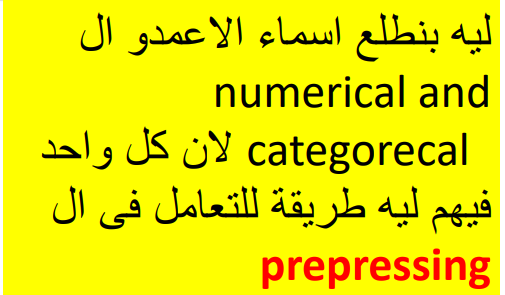

In [53]:
#3 
## Separete the columns according to type (numerical or categorical)
num_cols = [col for col in  X_train.columns if X_train[col].dtype in ['float64', 'int64']]

categ_cols = [col for col in  X_train.columns if X_train[col].dtype not in ['float64', 'int64']]

print('Numerical Columns : \n', num_cols)
print('**'*30)
print('Categorical Columns : \n', categ_cols)

Numerical Columns : 
 ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'rooms_per_household', 'bedroms_per_rooms', 'population_per_household']
************************************************************
Categorical Columns : 
 ['ocean_proximity']


# اذا كانت الاعمده بها قيم شاذه 
# out layers ( not a normal distrebution )
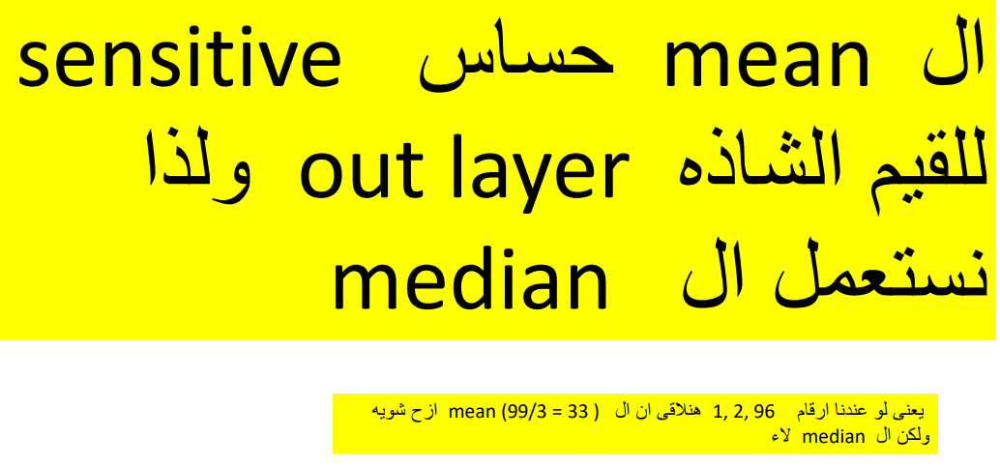

In [54]:
## I choose to impute the nulls with median --> using SimpleImputer
imputer = SimpleImputer(strategy='median')  ## define an instance

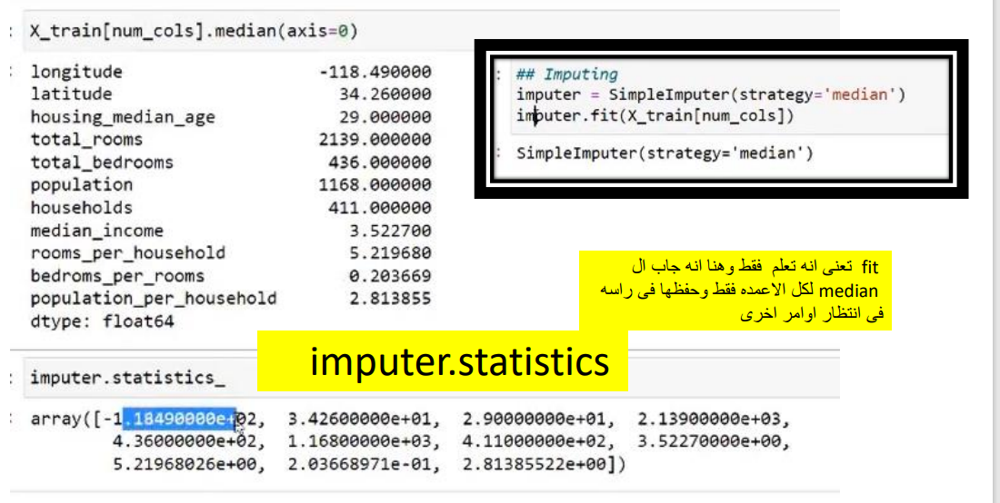

In [55]:
X_train_filled = imputer.fit(X_train[num_cols]) #  هوه جاب الميديان لكل عمود وحفظه فى راسه 
imputer.statistics_   # الدليل انها نفس القيم فى الخليه الى بعدها 

array([-1.18510000e+02,  3.42650000e+01,  2.90000000e+01,  2.13100000e+03,
        4.37000000e+02,  1.16800000e+03,  4.10500000e+02,  3.54090000e+00,
        5.23456397e+00,  2.02876796e-01,  2.81793691e+00])

In [56]:
X_train[num_cols].median()

longitude                   -118.510000
latitude                      34.265000
housing_median_age            29.000000
total_rooms                 2131.000000
total_bedrooms               437.000000
population                  1168.000000
households                   410.500000
median_income                  3.540900
rooms_per_household            5.234564
bedroms_per_rooms              0.202877
population_per_household       2.817937
dtype: float64

In [57]:
## fit and transform to training data (only Numerical)
X_train_filled = imputer.transform(X_train[num_cols])
X_train_filled
## transform test datasets

# X_test_filled = imputer.transform(X_test[num_cols])

array([[-118.27      ,   34.05      ,   12.        , ...,    1.46575342,
           0.61308411,    3.27123288],
       [-118.03      ,   33.97      ,   32.        , ...,    5.15240084,
           0.22366288,    2.48434238],
       [-121.26      ,   37.88      ,   42.        , ...,    5.        ,
           0.2       ,    2.75268817],
       ...,
       [-118.38      ,   34.03      ,   36.        , ...,    3.98671727,
           0.27082342,    3.33206831],
       [-121.96      ,   37.58      ,   15.        , ...,    6.39534884,
           0.16699301,    3.17889088],
       [-122.42      ,   37.77      ,   52.        , ...,    3.40257649,
           0.31116895,    2.10869565]])

#  الناتج بيكون مصفوفه وليس داتا فرايم 
# the result from simpleimputer is array not data frame

In [58]:
# should transfer it to data frame first 
pd.DataFrame(X_train_filled).isna().sum()  # to check if imputing is done 

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
dtype: int64

# خد بالك عملنا الفت على عينة التدريب بس 
# اوعى تعمل فت على عينة الاختبار او اى عينه تانيه 
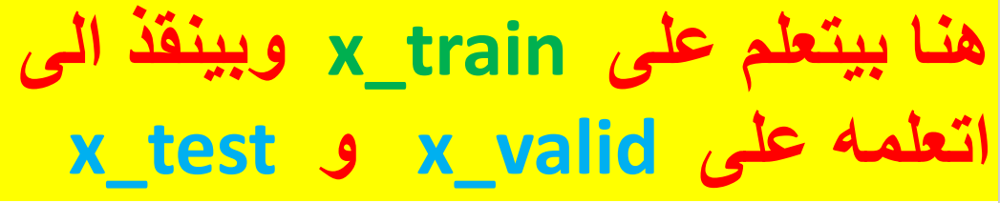


In [59]:
## transform test datasets

X_test_filled = imputer.transform(X_test[num_cols])
X_test_filled

array([[-119.01      ,   36.06      ,   25.        , ...,    4.19220056,
           0.2028768 ,    3.87743733],
       [-119.46      ,   35.14      ,   30.        , ...,    5.03938356,
           0.2028768 ,    2.67979452],
       [-122.44      ,   37.8       ,   52.        , ...,    3.97715472,
           0.2028768 ,    1.36033229],
       ...,
       [-119.18      ,   34.21      ,   46.        , ...,    4.39658849,
           0.23472357,    3.24520256],
       [-117.41      ,   34.23      ,   17.        , ...,    6.30496454,
           0.14735658,    3.11347518],
       [-117.9       ,   34.13      ,   37.        , ...,    4.23764706,
           0.23431427,    3.68      ]])

### `Standardize the Dataset`

In [60]:
## using StandardScaler for each Feature to be (mean=0, std=1)
## This techniques helps for better training and to converge faster and put all features in the same scale
scaler = StandardScaler()  ## define an instance



In [61]:
X_train_scaled = scaler.fit(X_train_filled)
X_train_scaled

StandardScaler()

In [62]:
scaler.mean_

array([-1.19581640e+02,  3.56432091e+01,  2.85830483e+01,  2.63827776e+03,
        5.38051699e+02,  1.42623353e+03,  4.99773313e+02,  3.87451445e+00,
        5.43589847e+00,  2.12891898e-01,  3.08818392e+00])

In [63]:
# just to ckeck if it is learnet  ,  no need for this check 
print(X_train_filled.mean(axis= 0))
print('#########')
print(scaler.mean_) 
print('#########')
print(X_train_filled.std(axis= 0)) 
print('#########')
print(scaler.scale_)

[-1.19581640e+02  3.56432091e+01  2.85830483e+01  2.63827776e+03
  5.38051699e+02  1.42623353e+03  4.99773313e+02  3.87451445e+00
  5.43589847e+00  2.12891898e-01  3.08818392e+00]
#########
[-1.19581640e+02  3.56432091e+01  2.85830483e+01  2.63827776e+03
  5.38051699e+02  1.42623353e+03  4.99773313e+02  3.87451445e+00
  5.43589847e+00  2.12891898e-01  3.08818392e+00]
#########
[2.00549731e+00 2.13673849e+00 1.26079583e+01 2.17454255e+03
 4.18376995e+02 1.13436104e+03 3.80732950e+02 1.89541311e+00
 2.53486770e+00 5.79626516e-02 1.12343237e+01]
#########
[2.00549731e+00 2.13673849e+00 1.26079583e+01 2.17454255e+03
 4.18376995e+02 1.13436104e+03 3.80732950e+02 1.89541311e+00
 2.53486770e+00 5.79626516e-02 1.12343237e+01]


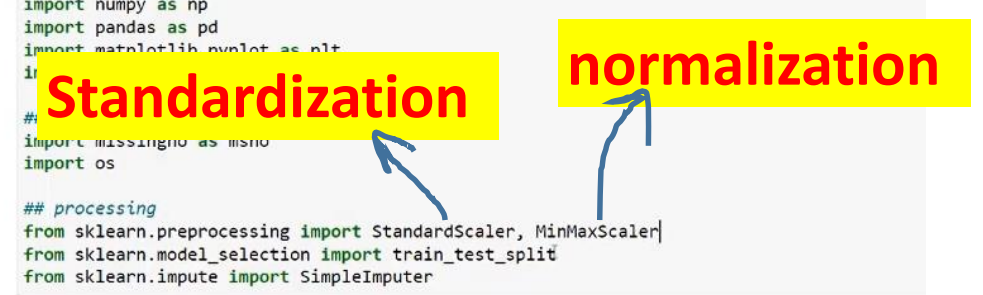

In [64]:
## fit and transform to training data (only Numerical)
#X_train_scaled = scaler.fit_transform(X_train_filled)
X_train_scaled = scaler.transform(X_train_filled)
## transform valid and test datasets

X_test_scaled = scaler.transform(X_test_filled)

# ****************************************************************
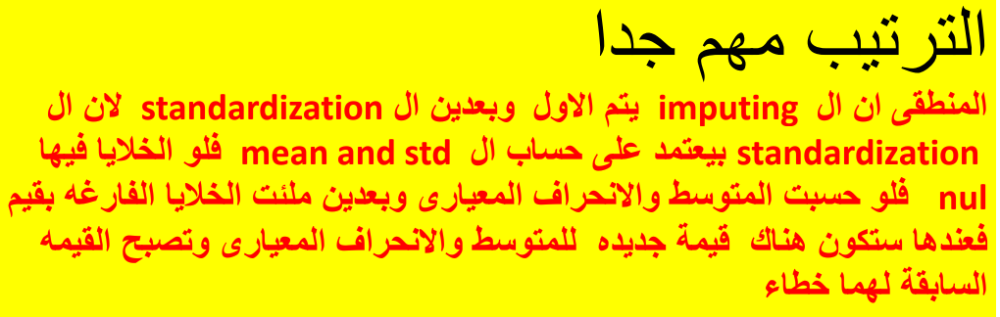

# ************************************************************************
### `Pipeline for Numerical Features  --  I will use it in this Project`
`Building a pipeline is much easier and better while inference at new dataset`
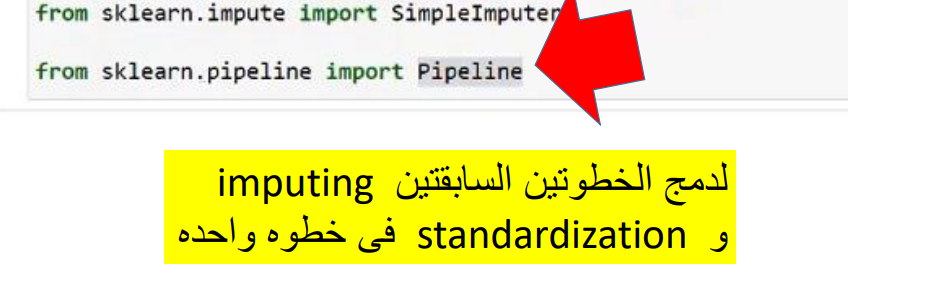

# ************************************************************************

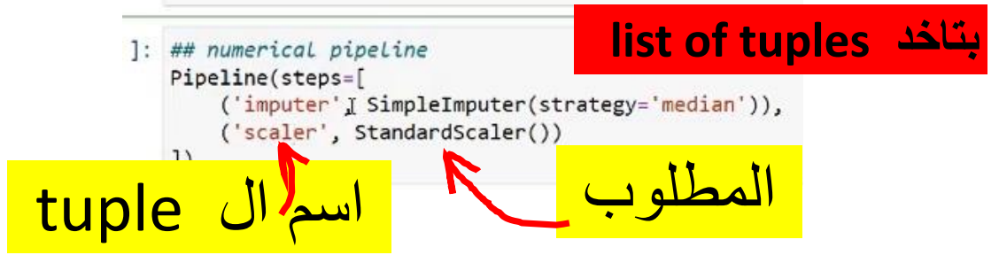

In [65]:
## Building a pipeline for numerical variables
num_pipline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

## deal with (num_pipline) as an instance -- fit and transform to train dataset and transform only to other datasets
X_train_num = num_pipline.fit_transform(X_train[num_cols])
# X_valid_num = num_pipline.transform(X_valid[num_cols])
X_test_num = num_pipline.transform(X_test[num_cols])  ## much easier and much better

# **********************************************
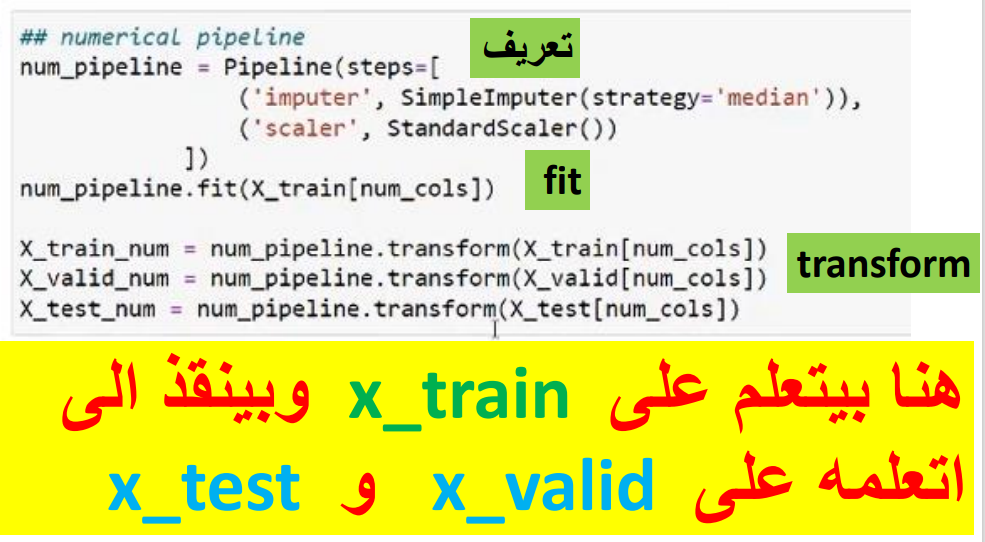

#     **************************************************
# بعض الاجوزمات لا يقبل الخلايا الفارغة فلابد من ملئ هذه الخلايا 
# وبعضها لا يقبل الداتا الغير رقميه فلابد من تحويلها الى رقميه
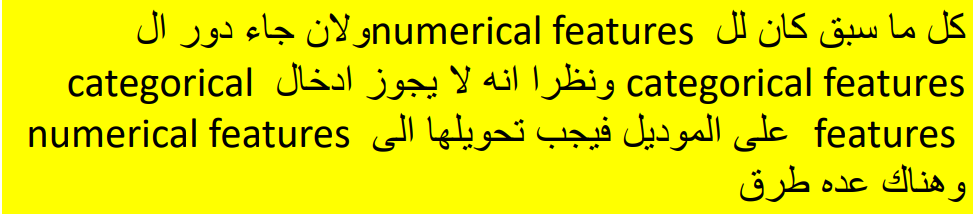

# random forest can accept data with nulls , without standaradization and can accept categorical data

### `Categorical Features`
`Categorical Features should be encoed before being passed to the Model, there are more than one type of encoding`
* `Label Encoding: mapping categories to numbers start from 0 to the length of categories and map these values in one column`
* `Ordinal Encoding: mapping ordinal categories start from 0 to the length of categories but orderd 0<1<2 ...`
* `OHE = One Hot Encoding: mapped to multiple columns, column for each category, each column contains ones when this category is mentioned`

In [66]:
np.unique(df_housing['ocean_proximity'])

array(['1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
      dtype=object)

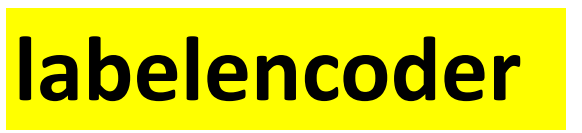

# *************************************************************
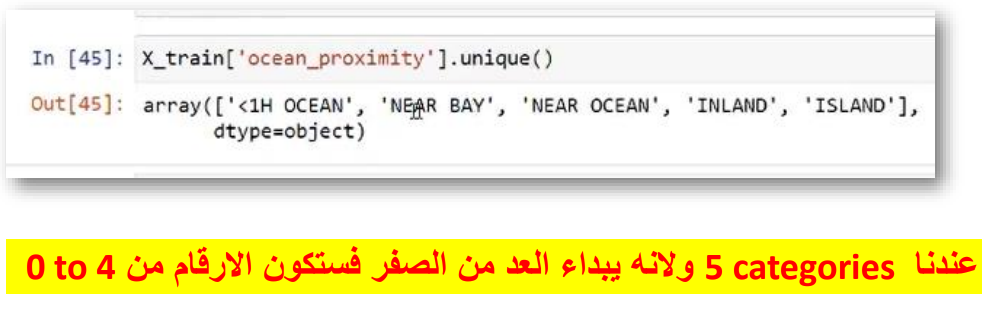


# *************************************************************
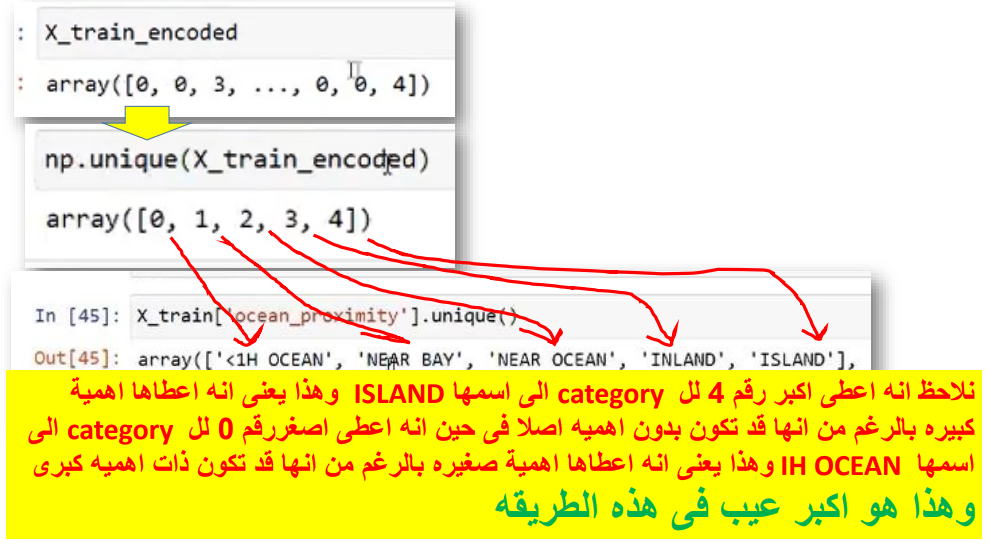

In [67]:
X_train[categ_cols].values.shape #  2D 

(17544, 1)

In [68]:
X_train[categ_cols].values.shape[0] # 1D

17544

In [69]:
lbl_encoder = LabelEncoder()    ## define an instance
X_train_encoded = lbl_encoder.fit(X_train[categ_cols].values)

C:\Users\hmohammad\Anaconda3\envs\tensorflow\lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


## *********************************************
# should be 1D
## *********************************************

In [70]:
lbl_encoder = LabelEncoder()    ## define an instance
X_train_encoded = lbl_encoder.fit(X_train[categ_cols].values[: , 0]) # working

In [71]:
## Let's use here for (ocean_proximity) --> use LabelEncoder (Try to use OHE)
lbl_encoder = LabelEncoder()    ## define an instance
X_train_encoded = lbl_encoder.fit_transform(X_train[categ_cols].values[:, 0])  ## for train 
#  لازم ندخل له ون دى     accept 1D only


X_test_encoded = lbl_encoder.transform(X_test[categ_cols].values[:, 0])

# *******************************************************
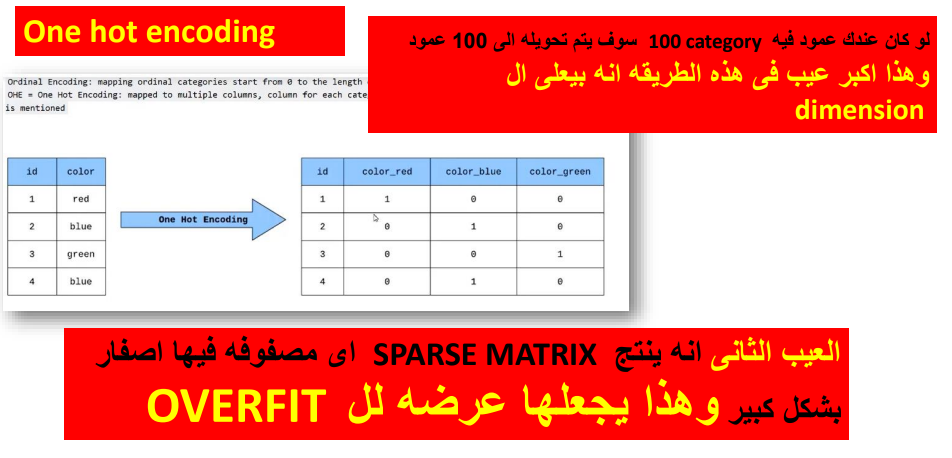

# One-hot encoding removed index; put it back
X_train_set_final.index = X_train_set.index
## it is known that oneHotEncoder drop columns names

In [72]:
OHE = OneHotEncoder(sparse_output=False)
X_train_cat = OHE.fit_transform(X_train[categ_cols])

### `Pipeline for Categorical Features -- I will use it in this Project`
`Use OHE -> it is preferable to use OHE when encoding for Features, But if you are encoding the Target, you MUST encode using LabelEncoder, except in Deep Learning we can use OHE for target, but for now, you can use LabelEncoder or OrdinalEncoder or OneHotEncoder for Features and only LabelEncoder for target --- take care of this Note`

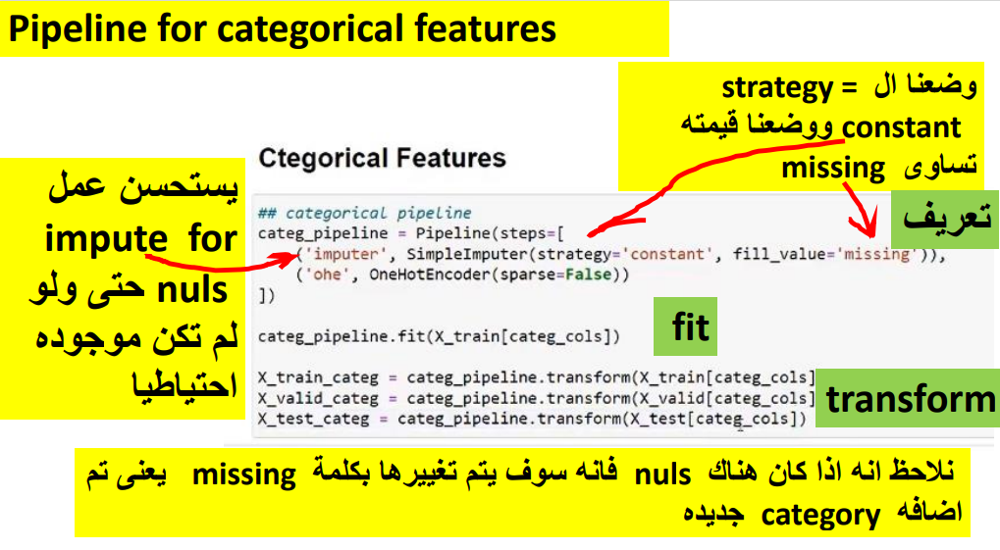

In [73]:
## Define pipeline for categorical columns --> use OneHotEncoder = OHE
categ_pipeline = Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
            ('OHE', OneHotEncoder(sparse_output=False))])


## deal with (categ_pipeline) as an instance -- fit and transform to train dataset and transform only to other datasets
X_train_categ = categ_pipeline.fit_transform(X_train[categ_cols])

X_test_categ = categ_pipeline.transform(X_test[categ_cols])  ## much easier and much better

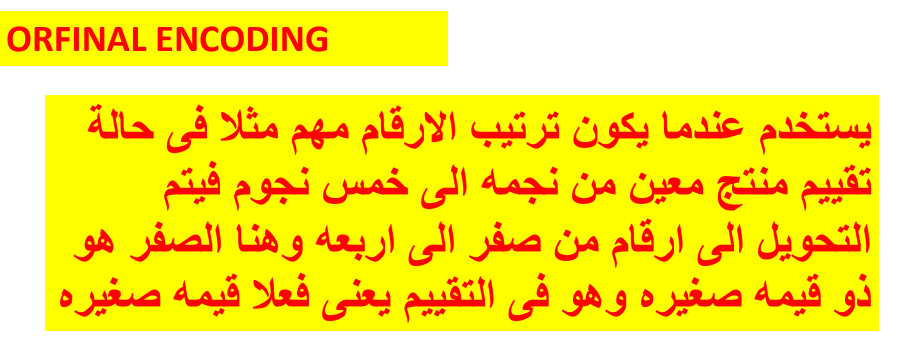

### `Get all Together`
* `Now we have outputs from Numerical Pipeline and Cateforical Pipeline`
* `We have two solutions:`
    * `Conactenate the Features (Numerical after processing) and (Encoded Categorical)`
    * `You can use (FeatureUnion or ColumnTransformer) provided in sklearn`
   

In [74]:
# ## We can get much much easier like the following
# ## numerical pipeline
# num_pipeline = Pipeline([
#                     ('selector', DataFrameSelector(num_cols)),    ## select only these columns
#                     ('imputer', SimpleImputer(strategy='median')),
#                     ('scaler', StandardScaler())])

# ## categorical pipeline
# categ_pipeline = Pipeline(steps=[
#             ('selector', DataFrameSelector(categ_cols)),    ## select only these columns
#             ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
#             ('OHE', OneHotEncoder(sparse=False))])

# ## concatenate both two pipelines
# total_pipeline = FeatureUnion(transformer_list=[
#                                 ('num_pip', num_pipeline),
#                                 ('categ_pipeline', categ_pipeline)])

# ## deal with (total_pipeline) as an instance -- fit and transform to train dataset and transform only to other datasets
# X_train_final = total_pipeline.fit_transform(X_train)
# X_valid_final = total_pipeline.transform(X_valid)
# X_test_final = total_pipeline.transform(X_test)                 ### Every thing is processed :D

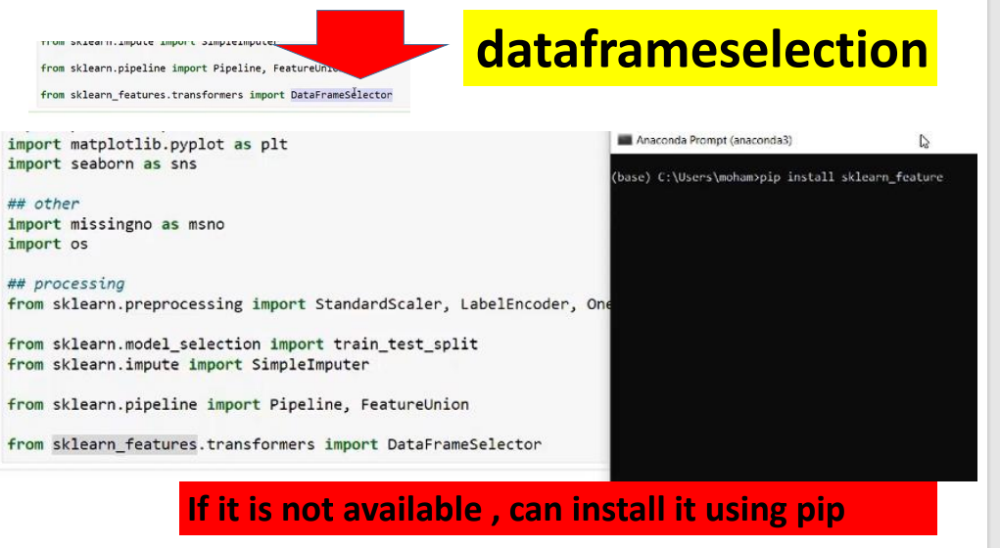

# **********************************************************************
# install  sklearn_features
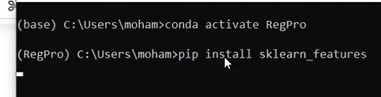

# ***************************************************************************
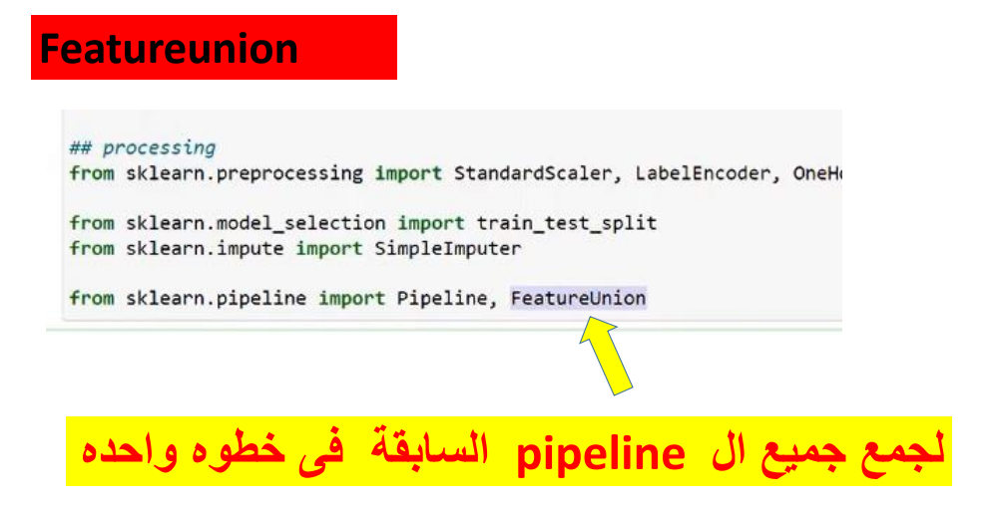

# **********************************************************************
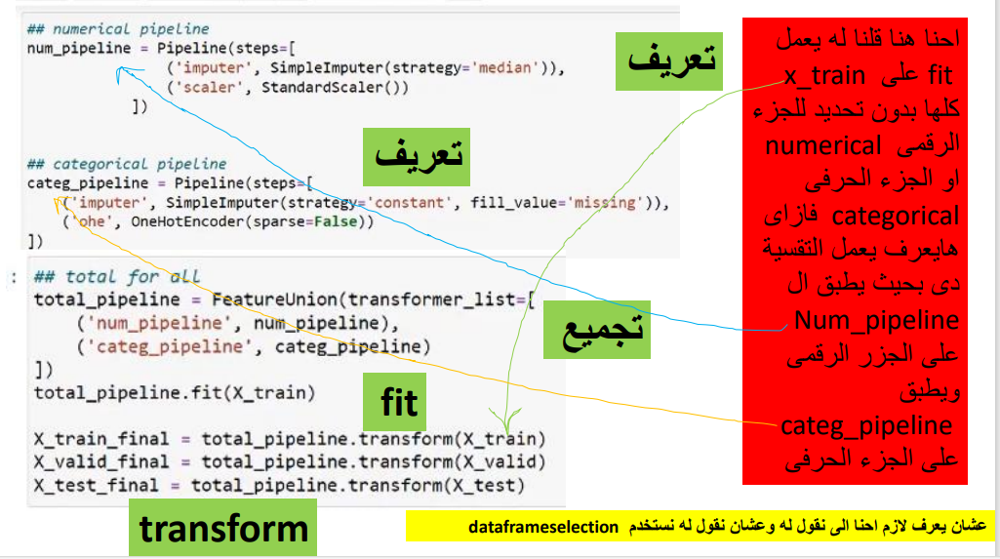

In [75]:
## We can get much much easier like the following
## numerical pipeline
num_pipeline = Pipeline([
                    ('selector', DataFrameSelector(num_cols)),    ## select only these columns
                    ('imputer', SimpleImputer(strategy='median')),
                    ('scaler', StandardScaler())])

## categorical pipeline
categ_pipeline = Pipeline(steps=[
            ('selector', DataFrameSelector(categ_cols)),    ## select only these columns
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
            ('OHE', OneHotEncoder(sparse_output=False))])

## concatenate both two pipelines
total_pipeline = FeatureUnion(transformer_list=[
                                ('num_pip', num_pipeline),
                                ('categ_pipeline', categ_pipeline)])

## deal with (total_pipeline) as an instance -- fit and transform to train dataset and transform only to other datasets
X_train_final = total_pipeline.fit_transform(X_train)

X_test_final = total_pipeline.transform(X_test)                 ### Every thing is processed :D

#   مهم جدا -
# اولا 
# categ_cols  and num_cols 
#    هى مجرد لسته اسماء وليست الاعمده نفسها ولذا نستعمل 
num_cols = [col for col in  X_train.columns if X_train[col].dtype in ['float64', 'int64']]

categ_cols = [col for col in  X_train.columns if X_train[col].dtype not in ['float64', 'int64']]
# ولا نستعمل 
 pandas.select_dtypes(include='object')
# واذا استعملناها يجب ان نضع بعد الاسماء 
 .columns  
# عشان يرجع اسماء الاعمده 
 num_cols.columns and categ_cols.columns 
 
 #  ثانيا
 ## featureUnion 
 ## بترجع الاعمده بنفس الترتيب يعنى الاعمده الرقميه كلها الاول ثم الاعمده الغير رقميه ثانيا بنفس الترتيب المكتوب فى الكود 

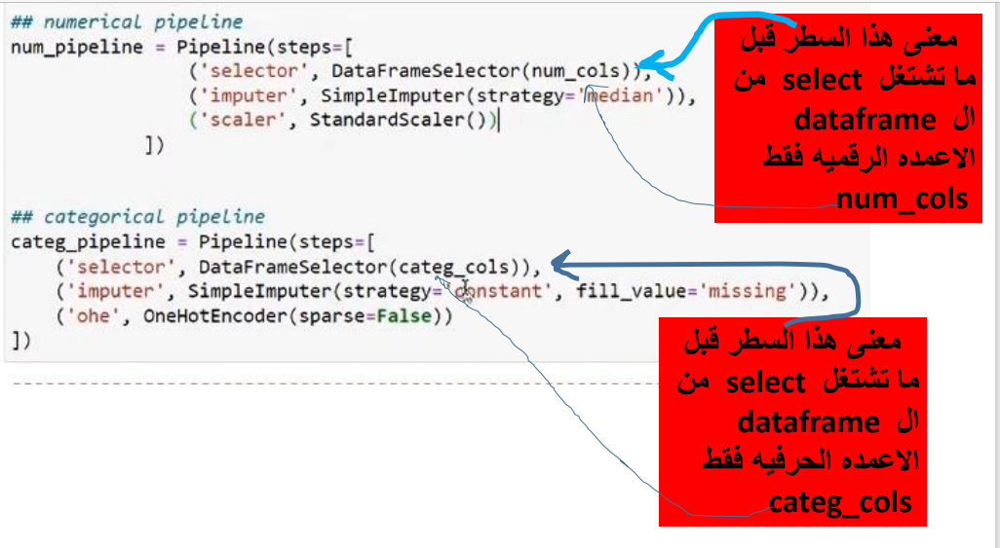

### `Building ML Models`

`Evaluation Metric: MSE`
احنا هنا عندنا ريجريشن وعشان كده اخترنا هذا المقياس ولذا لن نهتم ياى مقياس اخر لان بعض المقاييس قد تعطى نتائج مختلفة لنفس الداتا 

### `LinearRegression`

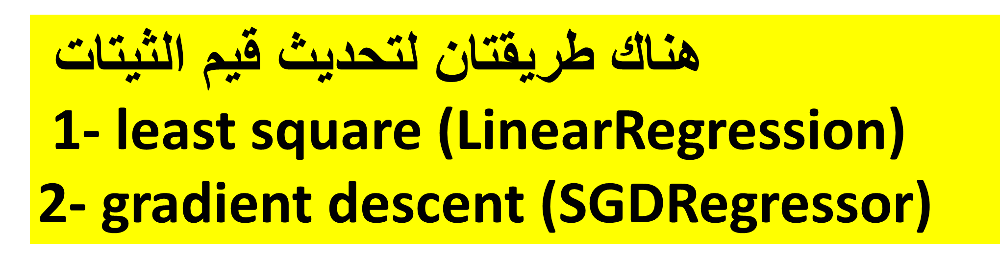

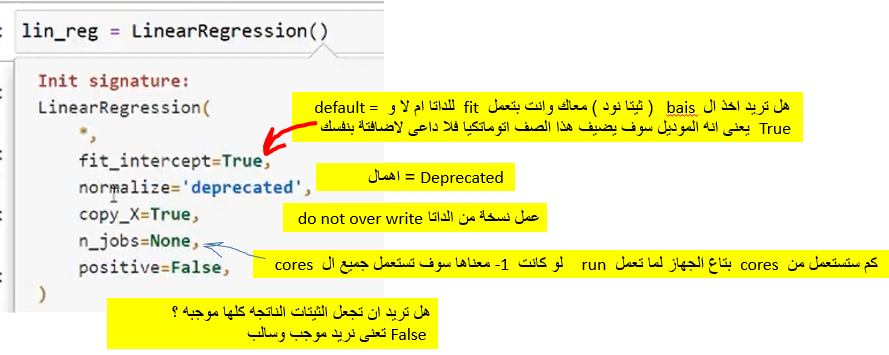

In [76]:
## define the model
lin_reg = LinearRegression()
lin_reg.fit(X_train_final, y_train)  ## train

LinearRegression()

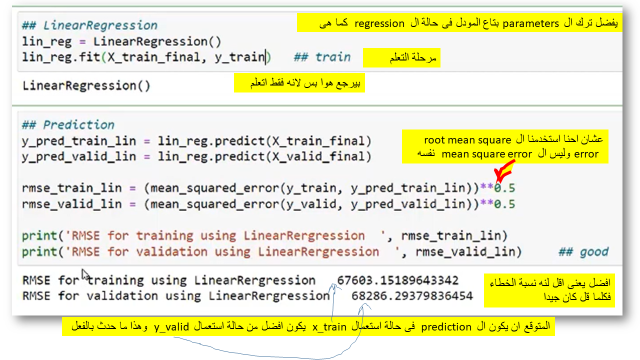

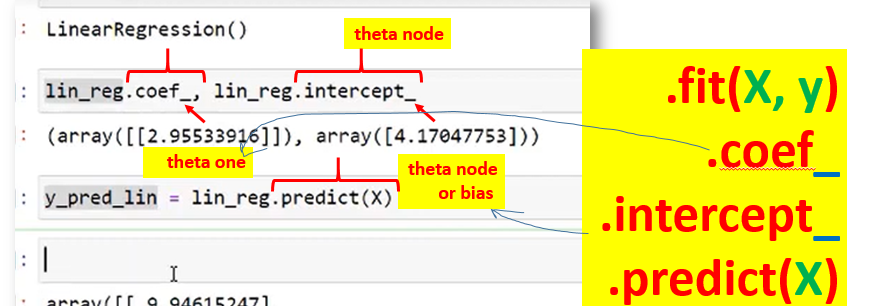

#     ------------------------------------------------------------------------------>    .SCORE 


In [96]:
lin_reg.coef_, lin_reg.intercept_   #  يعطى الثيتات والبايس      thetas and b(bais)

(array([-56184.04000997, -56481.67278334,  13865.47497456,   6121.36866331,
          8917.83877966, -46640.74395353,  36635.13814887,  79167.50957127,
          6353.87452105,  16581.11317897,    703.20742147, -22049.31963557,
        -56524.85301347, 124491.42764171, -27569.68606494, -18347.56892772]),
 239967.5707416455)

In [97]:
lin_reg.score(X_train_final, y_train)

0.6577509701605881

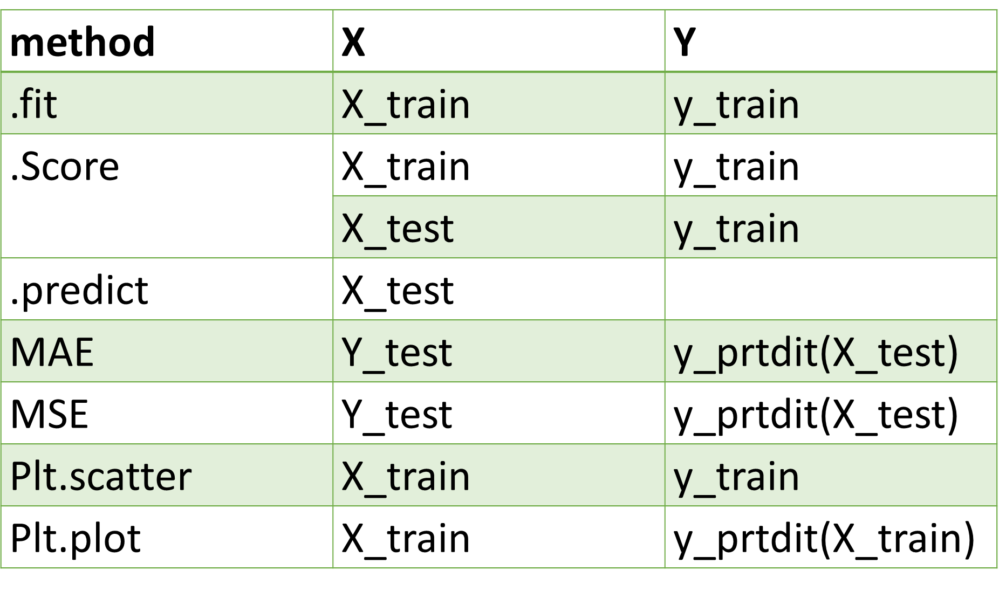

In [93]:
lin_reg.score(X_test_final, y_test)

0.6303186871802547

In [94]:
y_pred_train = lin_reg.predict(X_train_final)
MSE_train = mean_squared_error(y_train, y_pred_train)

RMSE_train = np.sqrt(MSE_train)
RMSE_train

67601.23164343799

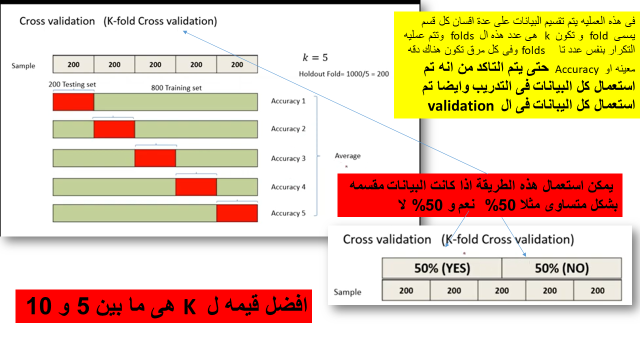



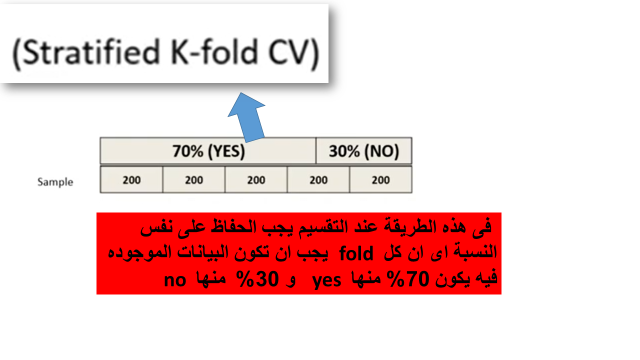

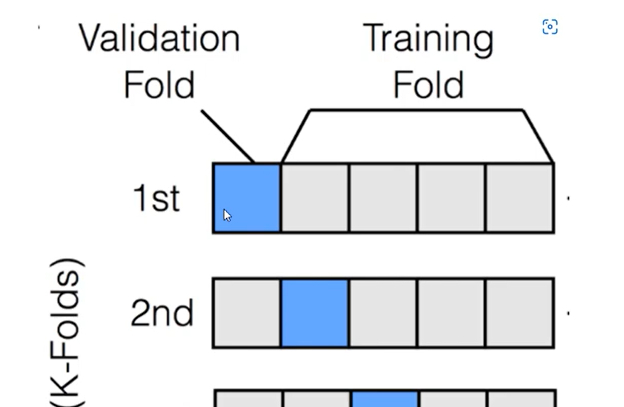

#  بيعمل توقع بريدكشن للداتا ويجيب الاسكور فى خطوه واحد 
# عشان كده بنسمى المتغير با اسكور 
# mse_score_lin


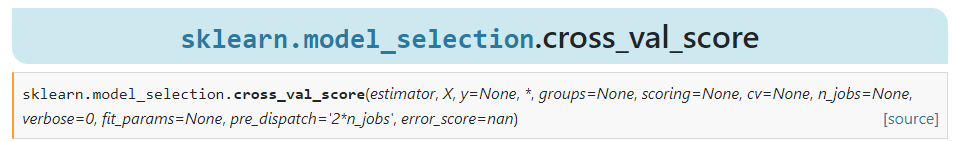

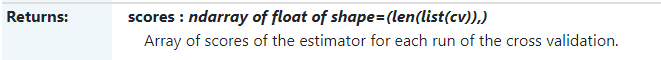

In [1]:
mse_score_lin = cross_val_score(estimator=lin_reg, X=X_train_final, y=y_train ,
                               scoring='neg_mean_squared_error', cv = 5, n_jobs=-1)

NameError: name 'cross_val_score' is not defined

In [97]:
mse_score_lin

array([-4.41823797e+09, -4.79178538e+09, -4.40082480e+09, -4.49539026e+09,
       -4.94515248e+09])

In [98]:
np.sqrt(mse_score_lin*-1)

array([66469.82751873, 69222.72299233, 66338.71269872, 67047.67157431,
       70321.77810535])

In [99]:
rmsr_score_reg = np.sqrt(mse_score_lin*-1).mean()
rmsr_score_reg

67880.14257788868

# بيعمل توقع للداتا بس
# عشان كده بنسمى المتغير ب 
#  y_pred_lin


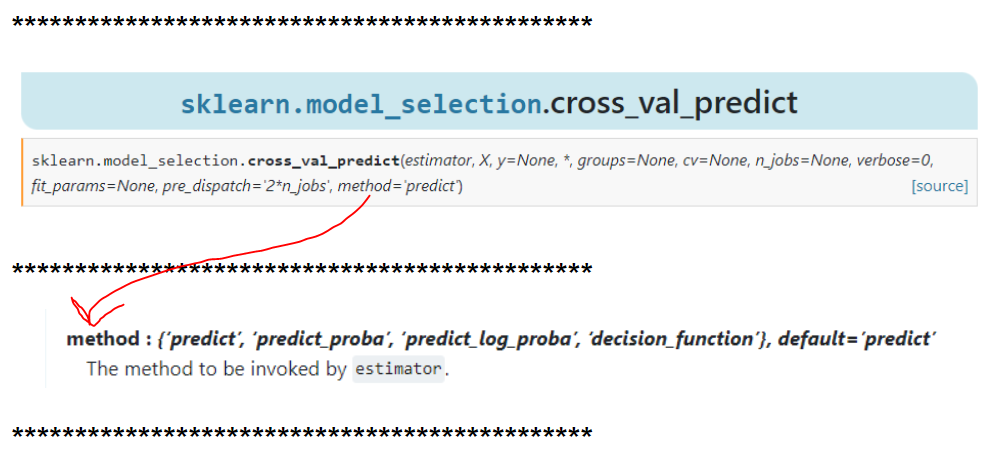






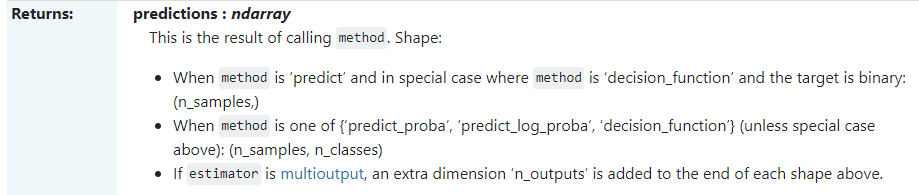

In [100]:
y_pred_lin = cross_val_predict(estimator=lin_reg, X= X_train_final,y= y_train 
                               , cv = 5, method='predict')
y_pred_lin

array([184295.23244419, 230100.88200316, 145096.2664977 , ...,
       195094.05173242, 278871.44475451, 272476.85764427])

# احنا عملنا شفلنج للداتا وبالتالى تغير ترتيب البيانات 
#  due to shuffling the order of instances is changed 
# that is mean the order of index is changed
# the index for the 1st instance in y_train is 4602 
# so if you need the 1st 10 instances in y_train 
# you can use y_train.vales[0,10]


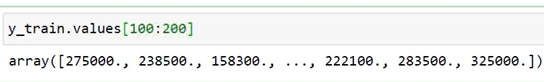


In [111]:
y_train.index

Index([ 4602,  6978, 16415,  2549, 11025, 18159,  3704,  8188, 14875, 16694,
       ...
       11363, 14423,  4426, 16850,  6265, 11284, 11964,  5390,   860, 15795],
      dtype='int64', length=17544)

In [127]:
print(f' ypredict using cross_val is       {y_pred_lin[0]} ')
print(f' ypredict using lin_reg is         {y_pred_train[0]} ')
print(f' real y  is                        {y_train[4602]} ') # 1st y after suffiling 


 ypredict using cross_val is       184295.23244419091 
 ypredict using lin_reg is         184114.33966863397 
 real y  is                        275000.0 


In [128]:
y_train

4602     275000.0
6978     238500.0
16415    158300.0
2549      70500.0
11025    222300.0
           ...   
11284    229200.0
11964     97800.0
5390     222100.0
860      283500.0
15795    325000.0
Name: median_house_value, Length: 17544, dtype: float64

In [129]:
MSE_score_cross = mean_squared_error(y_train, y_pred_lin)
MSE_score_cross

4610259090.477916

In [130]:
RMSE_score_cross = np.sqrt(MSE_score_cross)
RMSE_score_cross

67898.88872785706

### `SGDRegression`

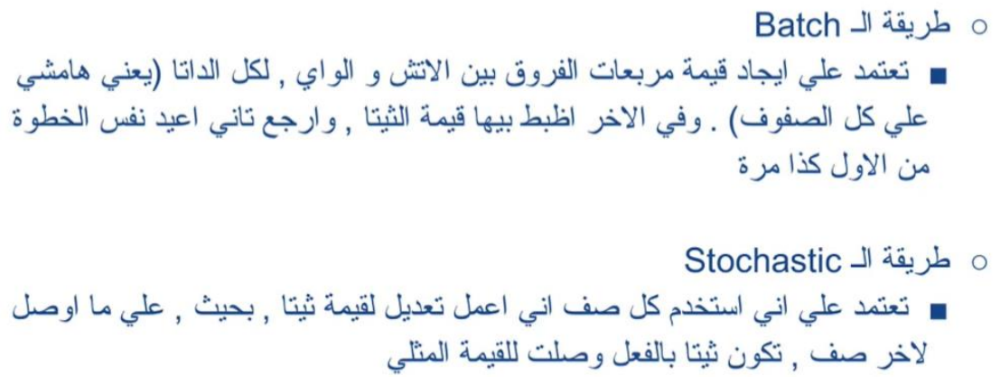


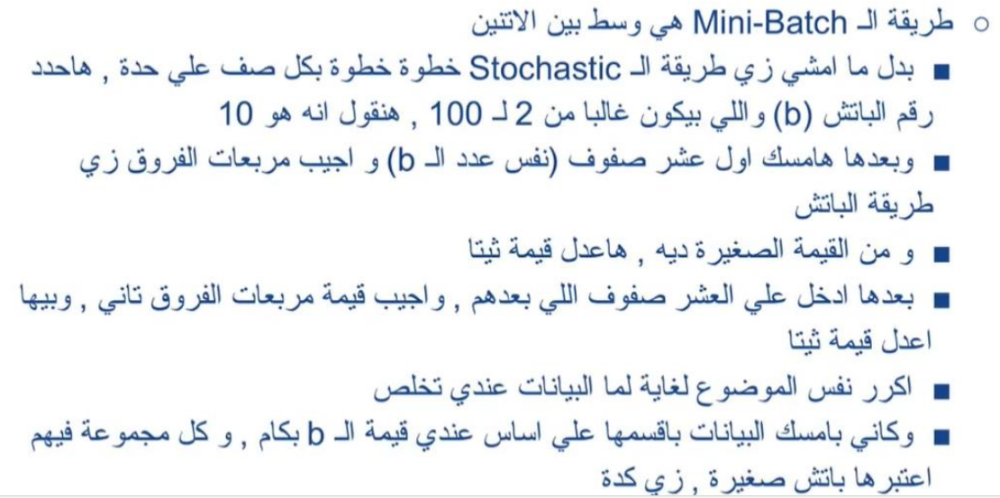

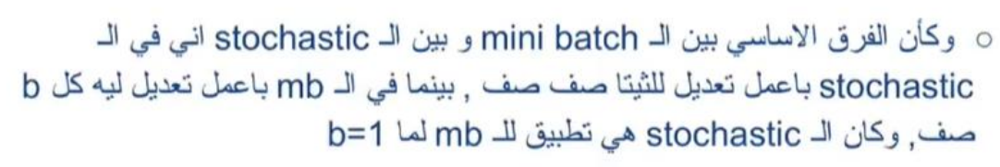

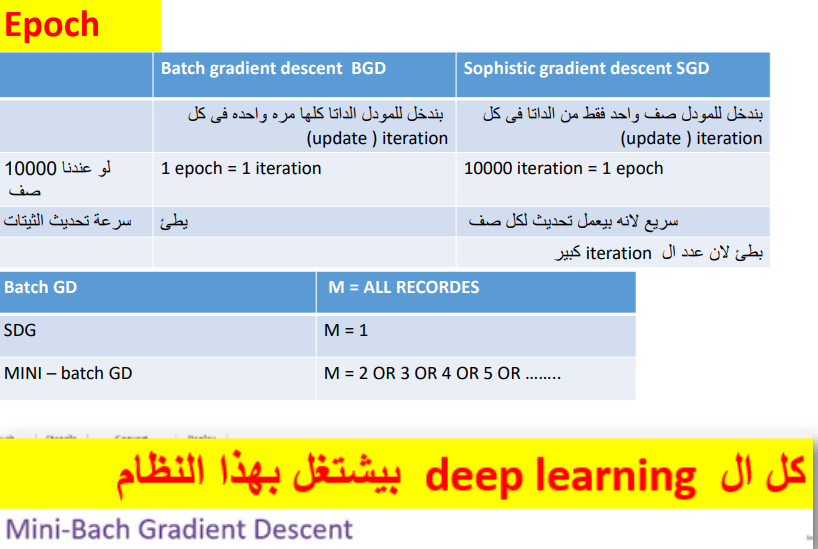

In [131]:
## define the model --> ## initialize some random Hyperparameter --> we will tune later
sgd_reg = SGDRegressor(penalty='l2', alpha=.0001, tol=0.001, eta0=0.001, shuffle=True, max_iter=10000)  
sgd_reg.fit(X_train_final, y_train)  ## train the model

SGDRegressor(eta0=0.001, max_iter=10000)

In [138]:
y_pred_sgd_model = sgd_reg.predict(X_train_final)

In [137]:
y_pred_sgd_cross_val = cross_val_predict(estimator= sgd_reg, X=X_train_final, y= y_train, 
                               cv = 5, method='predict' )

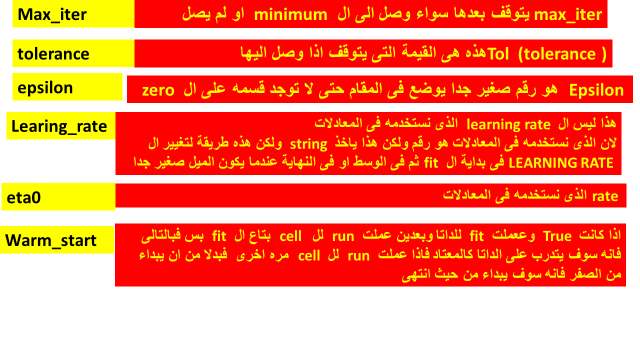


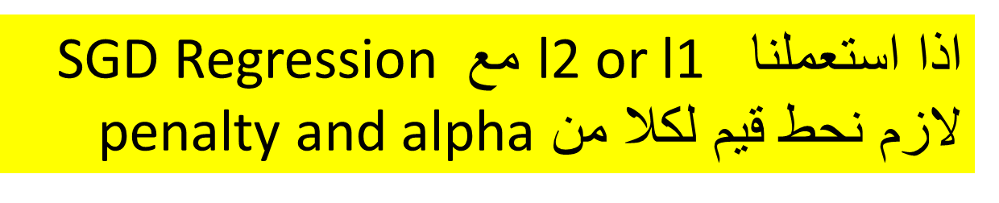

In [133]:
mse_score_sgd = cross_val_score(estimator=sgd_reg, X=X_train_final, y=y_train ,
                               scoring='neg_mean_squared_error', cv = 5, n_jobs=-1)
RMSE_sgd = np.sqrt(mse_score_sgd*-1).mean()
RMSE_sgd

67990.06928306536

In [139]:
print(f' ypredict using cross_val is       {y_pred_sgd_cross_val[0]} ')
print(f' ypredict using lin_reg is         {y_pred_sgd_model[0]} ')
print(f' real y  is                        {y_train[4602]} ') # 1st y after suffiling 


 ypredict using cross_val is       181272.55582257576 
 ypredict using lin_reg is         180923.9114261152 
 real y  is                        275000.0 


### If you want to build LinearRegression using Gradient Descent -- use SGDRegressor with penalty Hyperparameter
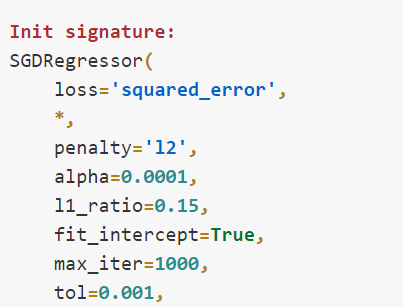

### `Regularized Models for Linear Regression Model`

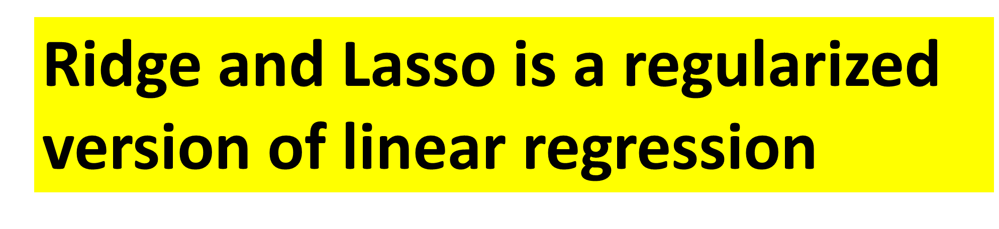

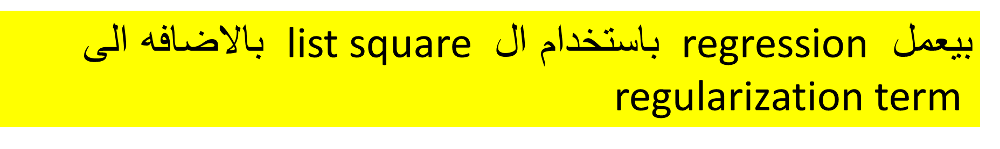

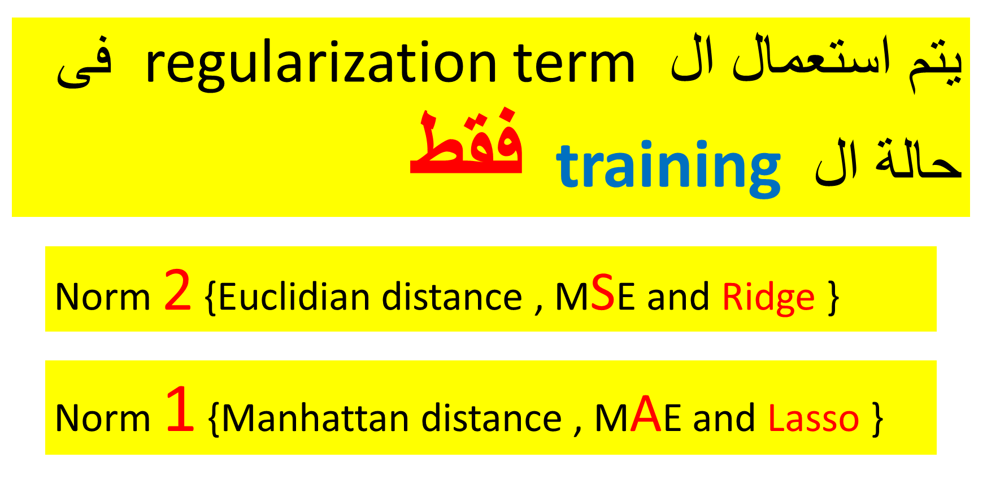

### `Ridge`

`Regression using Least Squares`

# solver
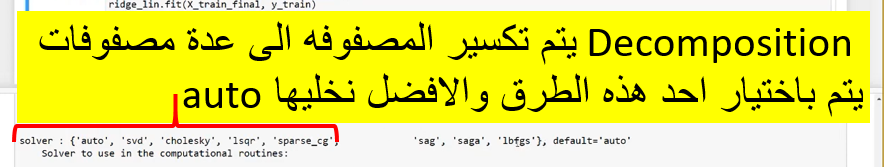

# alpha  
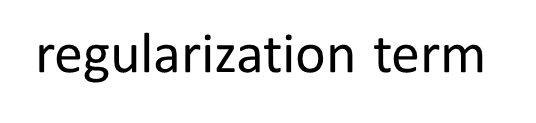

In [83]:
## Define Ridge Model (Regularized Version of LinearRegression)
ridge_reg = Ridge(alpha=0.9, solver='cholesky')
ridge_reg.fit(X_train_final, y_train)  ## train the model

Ridge(alpha=0.9, solver='cholesky')

In [84]:
mse_score_ridge_reg = cross_val_score(estimator=ridge_reg, X=X_train_final, y=y_train ,
                               scoring='neg_mean_squared_error', cv = 5, n_jobs=-1)
RMSE_ride_reg = np.sqrt(mse_score_ridge_reg*-1).mean()
RMSE_ride_reg 

67880.21922984191

### `Lasso`

`Regression using Least Squares`

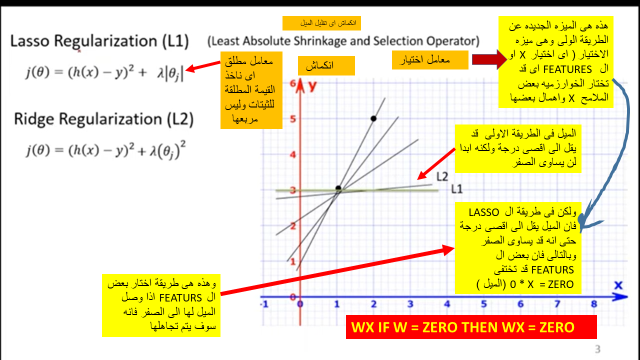

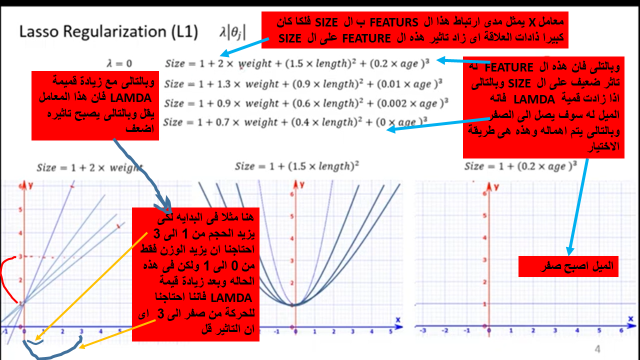


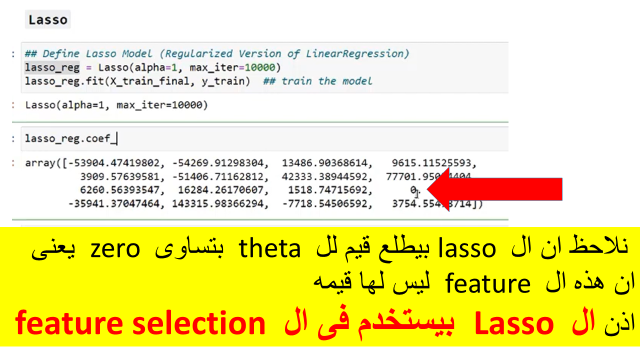


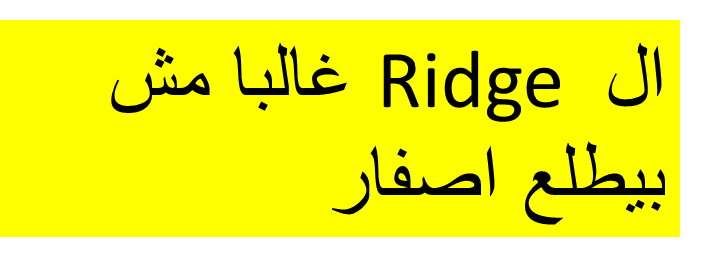

In [85]:
## Define Lasso Model (Regularized Version of LinearRegression)
lasso_reg = Lasso(alpha=1, max_iter=100000)
lasso_reg.fit(X_train_final, y_train)  ## train the model

Lasso(alpha=1, max_iter=100000)

In [86]:
lasso_reg.coef_   ## Weights will have zeros --> why ?  --> Important Question

array([-56166.28650229, -56466.30701119,  13864.90232431,   6112.77503543,
         8937.16731622, -46626.84295639,  36609.7003318 ,  79167.88726091,
         6350.89510096,  16578.08308073,    700.82893968,      0.        ,
       -34479.90501045, 143036.55857524,  -5501.79735044,   3698.19799083])

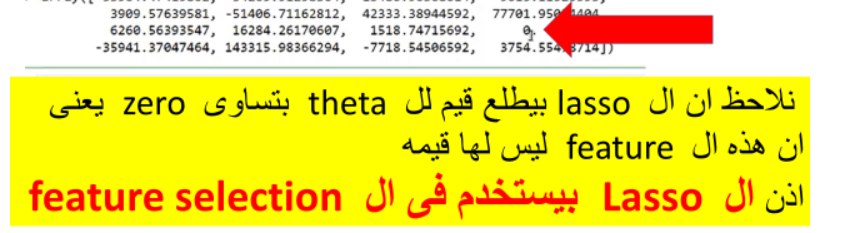

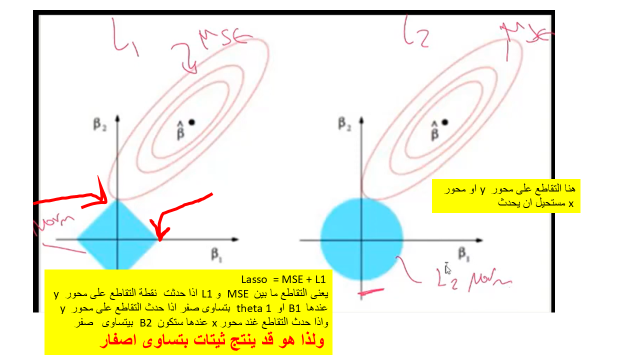

In [92]:
lasso_srore = cross_val_score(estimator= lasso_reg, X = X_train_final,y= y_train,cv = 5, n_jobs=-1,
                             scoring='neg_mean_squared_error')
RMSE_lasso = np.sqrt(lasso_srore *-1).mean()
RMSE_lasso

67879.97230187681

### `ElasticNet`
`Regression using Least Squares`

In [88]:
## Define ElasticNet Model (Regularized Version of LinearRegression)
elastic_reg = ElasticNet(alpha=0.1, l1_ratio=0.5)
elastic_reg.fit(X_train_final, y_train)  ## train the model

ElasticNet(alpha=0.1)

In [96]:
elastic_score = cross_val_score(estimator=elastic_reg, X=X_train_final, y= y_train, cv = 5,
                                scoring='neg_mean_squared_error')
RMSE_elastic = np.sqrt(elastic_score *-1).mean()
RMSE_elastic

68581.26101196748

In [99]:
# ## prediction
# y_pred_train_elastic = elastic_reg.predict(X_train_final)  ## predict the training data
# y_pred_valid_elastic = elastic_reg.predict(X_valid_final)  ## predict the training data

# ## RMSE
# rmse_train_elastic = (mean_squared_error(y_train, y_pred_train_elastic))**0.5
# rmse_valid_elastic = (mean_squared_error(y_valid, y_pred_valid_elastic))**0.5

# ## R2 score
# r2_train_elastic = r2_score(y_train, y_pred_train_elastic)
# r2_valid_elastic = r2_score(y_valid, y_pred_valid_elastic)


# print(f'RMSE for training set using ElasticNet -- {rmse_train_elastic:.4f}')
# print(f'RMSE for validating set using ElasticNet -- {rmse_valid_elastic:.4f}')   
# print('**'*40)
# print(f'R2 Score for training set using ElasticNet -- {r2_train_elastic:.4f}')
# print(f'R2 Score for validating set using ElasticNet -- {r2_valid_elastic:.4f}')         ## not bad

# polynomial 

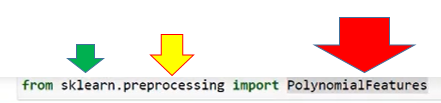



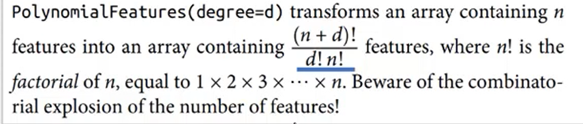

# هو كلاس وليس مودل يعنى احنا بنزود عدد المدخلات وبعدين نستخدم اى مودل من المودلات السابقة او اللاحقه 

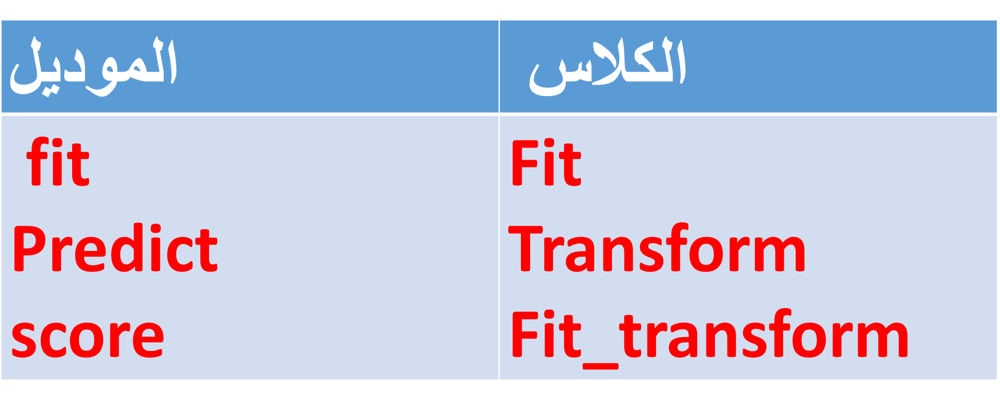

In [113]:
poly_feat = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly_feat.fit_transform(X_train_final)


In [114]:
X_train_poly.shape

(17544, 152)

In [116]:
lin_reg_poly = LinearRegression()
lin_reg_poly.fit(X_train_poly, y_train)

LinearRegression()

In [129]:
lin_reg_poly.coef_

array([-2.52446163e+15, -5.66089298e+13,  1.95046463e+13,  6.81801318e+12,
        2.25035481e+13, -8.93463438e+12, -3.82277389e+12, -1.06889259e+13,
        1.70039825e+13,  4.04370324e+13, -8.89816616e+11, -6.68640450e+13,
       -6.68640450e+13,  2.67456180e+14, -6.68640452e+13, -6.68640450e+13,
       -1.55326562e+03,  1.32464688e+04, -2.26783438e+04,  3.17810781e+04,
       -1.52806719e+04,  4.01703125e+03, -1.89891875e+04, -5.29946250e+04,
        2.13537500e+03, -1.38176719e+04,  4.32271680e+04,  2.52446162e+15,
        2.52446162e+15,  1.55059753e+14,  2.52446162e+15,  2.52446162e+15,
        6.13906250e+03, -2.92931406e+04,  4.11460625e+04, -4.13000938e+04,
        6.70566406e+03, -6.36292969e+03, -6.11352812e+04,  2.02657812e+03,
       -1.60151562e+04,  4.53584375e+03,  5.66089297e+13,  5.66089297e+13,
       -2.83044648e+14,  5.66089294e+13,  5.66089297e+13,  2.05462500e+03,
       -1.21109375e+04,  1.48920312e+04, -2.62917266e+04,  2.59143633e+04,
        1.66539062e+03,  

In [122]:
lin_reg_poly.score(X_train_poly, y_train)

0.7352024234519975

In [123]:
lin_reg.score(X_train_final, y_train)

0.6577509701605881

In [128]:
lin_reg_poly_score = cross_val_score(estimator=lin_reg_poly,X= X_train_poly, y= y_train,
                                     cv=5, scoring='neg_mean_squared_error')
print(lin_reg_poly_score)
RMSE_lin_reg_poly_score = np.sqrt(lin_reg_poly_score*-1).mean()
RMSE_lin_reg_poly_score

[-5.98400579e+25 -2.00042072e+10 -4.76840387e+24 -2.25093020e+23
 -6.58094401e+24]


2591815602388.596

KNN

# from sklearn.neighbors import KNeighborsRegressor

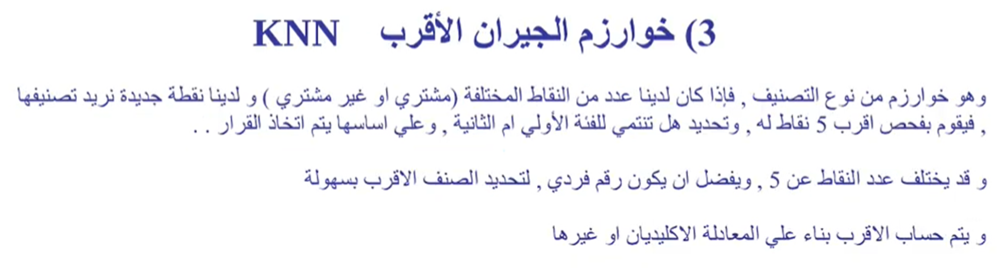


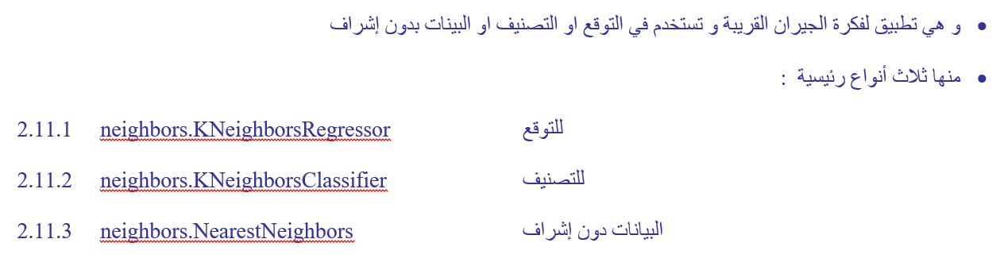


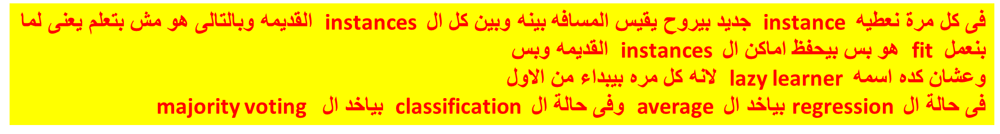


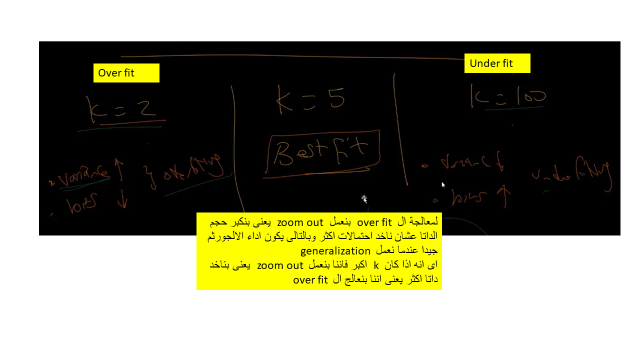

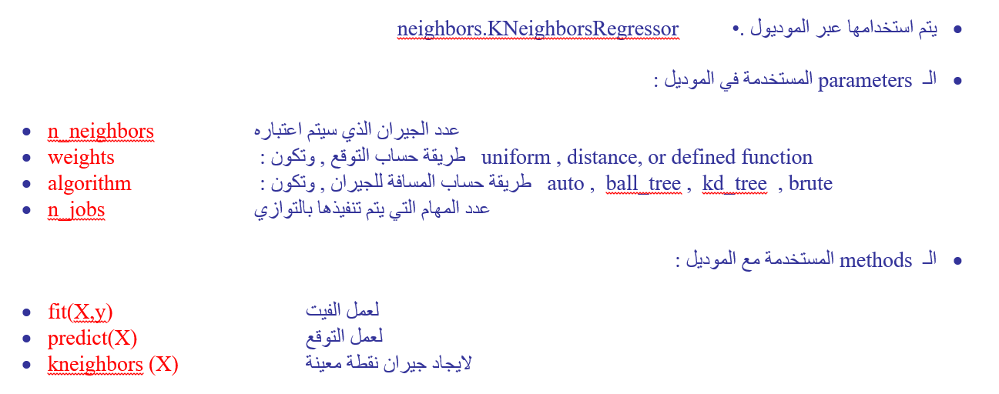

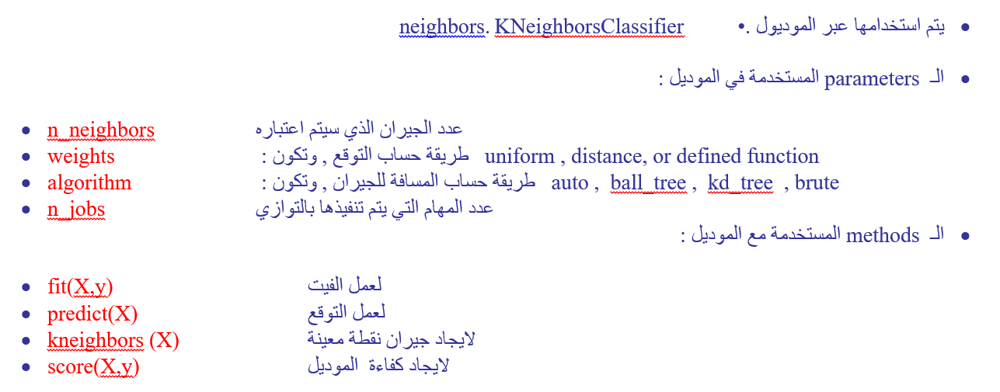

In [156]:
knn_reg = KNeighborsRegressor(n_neighbors=7, weights= 'uniform', p=1)

In [157]:
knn_reg_score = cross_val_score(estimator= knn_reg, X=X_train_final, y= y_train,
                                scoring='neg_mean_squared_error')
RMSE_knn_reg = np.sqrt(knn_reg_score * -1).mean()
RMSE_knn_reg

59353.26224703351

# Random Forest 

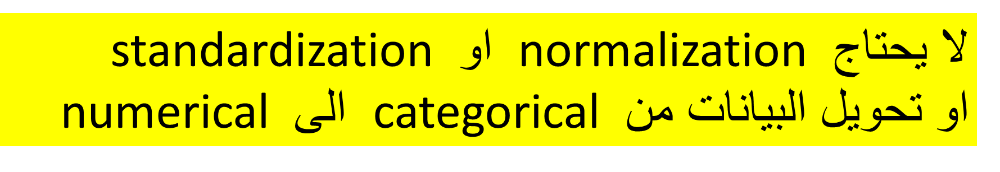

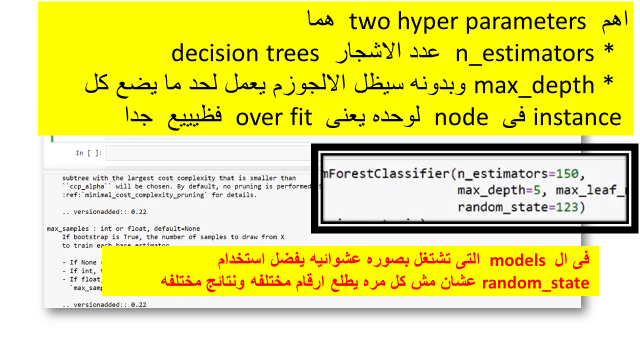

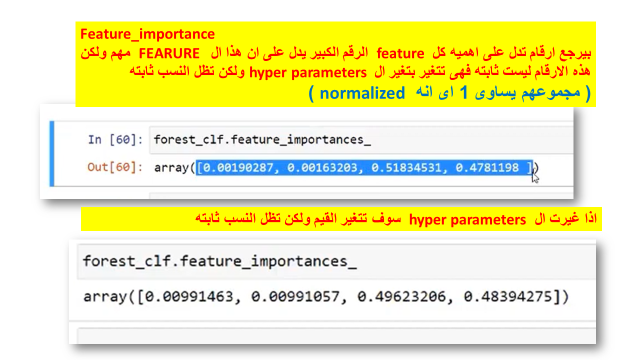

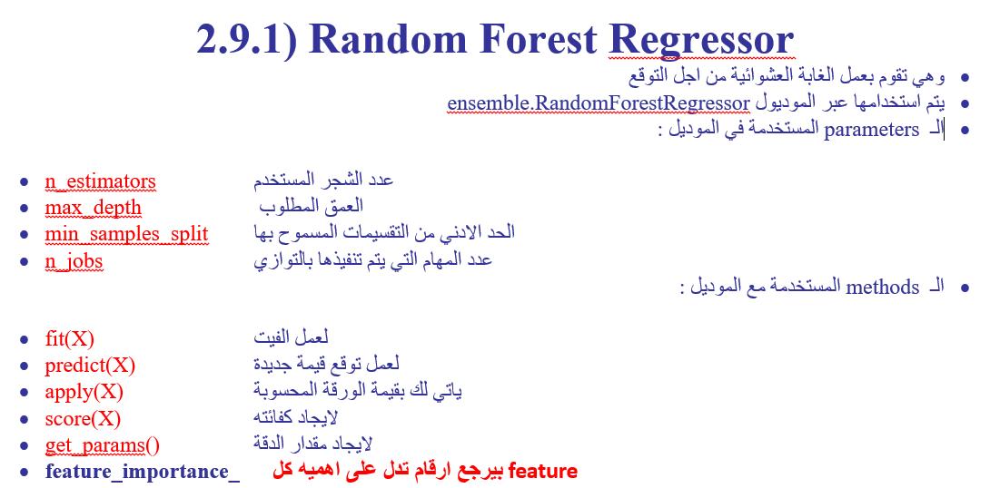

In [140]:
from sklearn.ensemble import RandomForestRegressor

In [141]:
random_reg = RandomForestRegressor(n_estimators=200, max_depth= 8, random_state=42, max_samples=0.8)

In [142]:
random_reg.fit(X_train_final, y_train)

RandomForestRegressor(max_depth=8, max_samples=0.8, n_estimators=200,
                      random_state=42)

In [151]:
random_reg.feature_importances_

array([3.25037097e-02, 2.99284872e-02, 3.43927639e-02, 3.46328427e-03,
       4.14304992e-03, 3.18354334e-03, 3.10219979e-03, 5.71492302e-01,
       7.88510524e-03, 9.17214807e-03, 1.23454753e-01, 2.33949015e-04,
       1.76002455e-01, 4.20222729e-05, 9.63435626e-05, 9.03883594e-04])

In [166]:
xx = pd.DataFrame(X_train_final)
xx

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.654023,-0.745627,-1.315284,-0.967228,-0.502063,-0.204726,-0.353984,-1.410413,-1.566214,6.904312,0.016294,1.0,0.0,0.0,0.0,0.0
1,0.773694,-0.783067,0.271015,-0.078305,0.033339,-0.208253,-0.054561,-0.024804,-0.111839,0.185826,-0.053750,1.0,0.0,0.0,0.0,0.0
2,-0.836879,1.046825,1.064165,-0.999418,-1.063758,-1.031624,-1.068395,-0.370692,-0.171961,-0.222417,-0.029863,0.0,1.0,0.0,0.0,0.0
3,-2.287891,2.408714,1.143480,-0.162461,-0.141145,-0.226765,-0.046682,-1.005435,-0.274269,-0.056310,-0.059004,0.0,0.0,0.0,0.0,1.0
4,0.878406,-0.867307,-0.204874,0.001252,0.226944,1.966540,0.307897,0.136849,-0.455846,0.462195,0.252697,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,0.808598,-0.871987,0.508960,-0.601634,-0.805617,-0.677239,-0.742708,1.316592,0.273440,-1.065584,-0.004978,1.0,0.0,0.0,0.0,0.0
17540,1.072871,-0.759667,0.350330,0.204973,0.076362,0.288062,-0.133357,-0.435005,0.565197,-0.484226,0.072639,0.0,1.0,0.0,0.0,0.0
17541,0.599173,-0.754987,0.588275,-0.247076,0.073972,0.290707,0.071511,-0.495994,-0.571699,0.999463,0.021709,1.0,0.0,0.0,0.0,0.0
17542,-1.185920,0.906424,-1.077339,0.430767,0.140898,0.309219,0.155560,0.973237,0.378501,-0.791870,0.008074,1.0,0.0,0.0,0.0,0.0


In [177]:
random_cross = cross_val_score(estimator= random_reg, X= X_train_final, y= y_train, cv=5 ,
                            scoring='neg_mean_squared_error'  )
RMSE_random_reg = np.sqrt(random_cross*-1).mean()
RMSE_random_reg

55772.39219212241

In [179]:
random_reg2 = RandomForestRegressor(n_estimators=300, max_depth= 10, random_state=42, max_samples=0.8)

In [180]:
random_cross = cross_val_score(estimator= random_reg2, X= X_train_final, y= y_train, cv=5 ,
                            scoring='neg_mean_squared_error'  )
RMSE_random_reg = np.sqrt(random_cross*-1).mean()
RMSE_random_reg

53002.617439368405

In [182]:
random_reg3 = RandomForestRegressor(n_estimators=500, max_depth= 10, random_state=42, max_samples=0.8)

In [183]:
random_cross = cross_val_score(estimator= random_reg3, X= X_train_final, y= y_train, cv=5 ,
                            scoring='neg_mean_squared_error'  )
RMSE_random_reg = np.sqrt(random_cross*-1).mean()
RMSE_random_reg

52992.71628005188

In [149]:
random_reg4 = RandomForestRegressor(n_estimators=400, max_depth= 18, random_state=42, max_samples=0.9)

In [153]:
random_reg4.fit(X_train_final, y_train)

RandomForestRegressor(max_depth=18, max_samples=0.9, n_estimators=400,
                      random_state=42)

In [150]:
random_cross = cross_val_score(estimator= random_reg4, X= X_train_final, y= y_train, cv=5 ,
                            scoring='neg_mean_squared_error'  )
RMSE_random_reg = np.sqrt(random_cross*-1).mean()
RMSE_random_reg

50233.050012339765

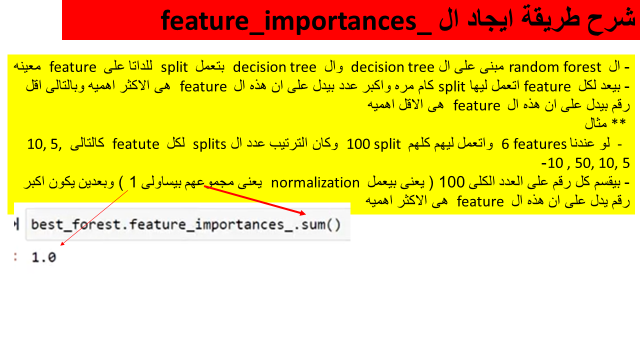

In [281]:
ran_forest_feat_important = random_reg4.feature_importances_
# ran_forest_feat_important = np.round(ran_forest_feat_important, decimals=3)


In [267]:
ran_forest_feat_important[0:11].shape

(11,)

In [268]:
len(num_cols)

11

<BarContainer object of 11 artists>

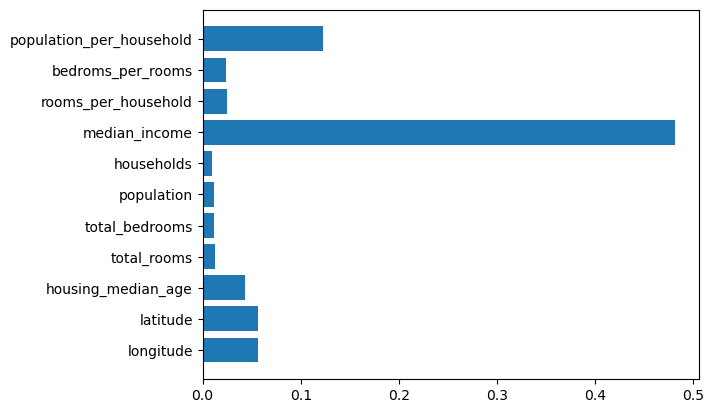

In [436]:
df1 = pd.Series(num_cols)
df2 = pd.Series(ran_forest_feat_important[0:11])
df = pd.concat([df1, df2], axis = 1)
df.columns = ['feat', 'score']
plt.barh(y = df.iloc[:, 0], width=df.iloc[:, 1])


In [362]:
df = pd.concat([df1, df2], axis = 1)
df.columns = ['feat', 'score']
df

,feat,score
0,longitude,0.056719
1,latitude,0.056063
2,housing_median_age,0.043523
3,total_rooms,0.012348
4,total_bedrooms,0.011408
5,population,0.011266
6,households,0.009921
7,median_income,0.481314
8,rooms_per_household,0.025360
9,bedroms_per_rooms,0.023777


In [363]:
df.dtypes

feat      object
score    float64
dtype: object

In [394]:
df.values[:, 0]

array(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'rooms_per_household', 'bedroms_per_rooms',
       'population_per_household'], dtype=object)

<Axes: >

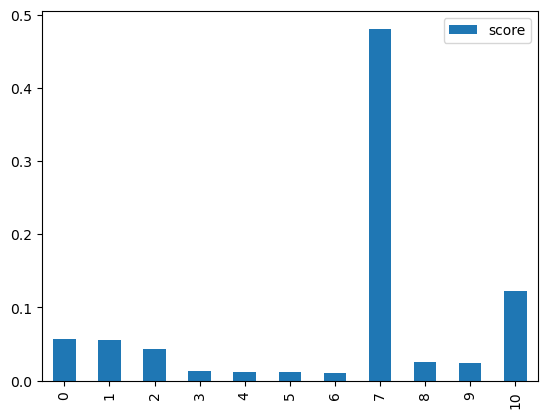

In [407]:
df.plot(kind = 'bar')


<BarContainer object of 11 artists>

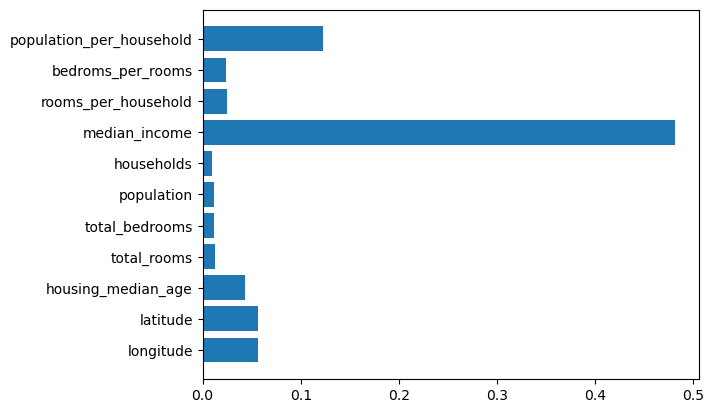

In [435]:
plt.barh(y = df.iloc[:, 0], width=df.iloc[:, 1])

# Hyperparameters Tuning

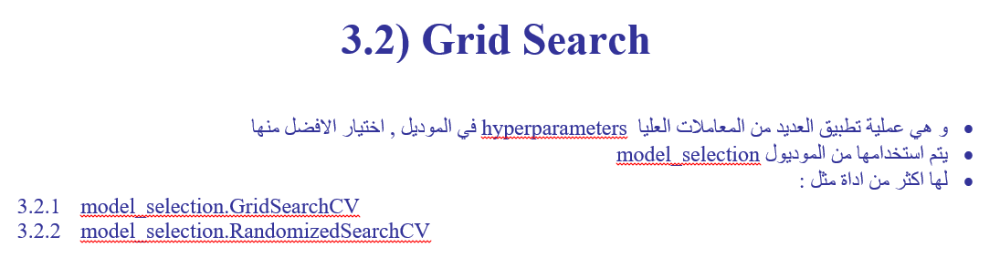

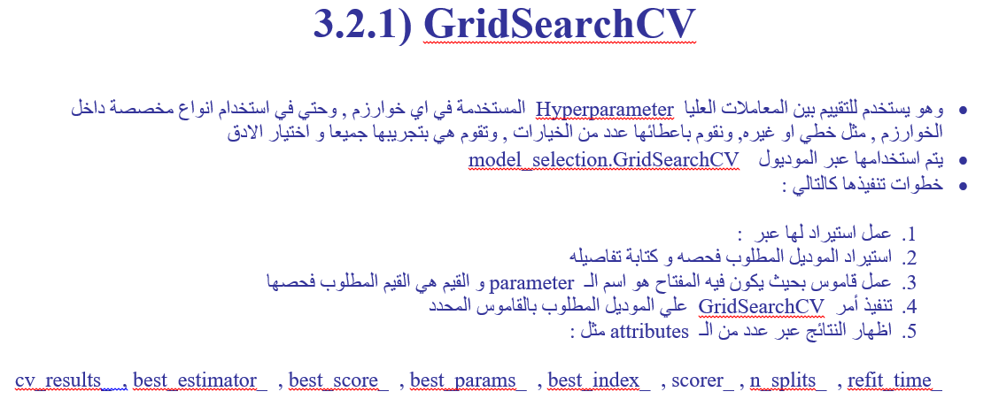

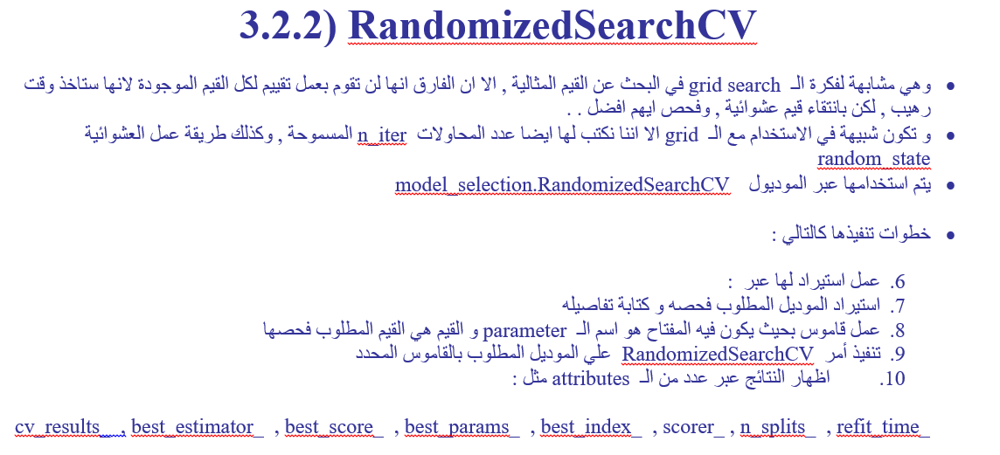

In [155]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

#  فى البدايه بنعمل قاوموس باسم البارامتر ومدى القيم 
# make a dict where 
##  the key ---> the name of the parameter 
## the value ----> the range 


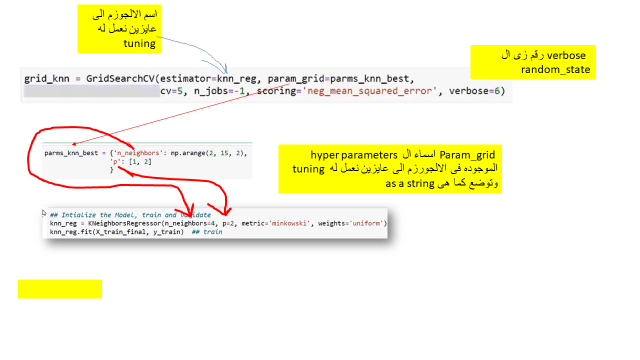

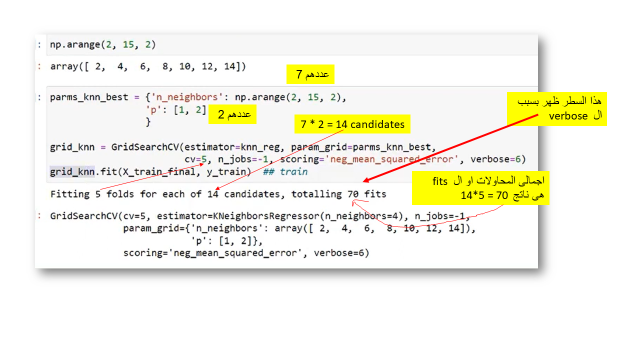

In [160]:
selected_parm_random_forest = {'n_estimators': np.arange(150, 500, 50),
                                'max_depth': np.arange(4, 20, 2),
                                'max_samples': [0.7, 0.8, 0.9, 1]  }

# n_estimators=400, max_depth= 18, random_state=42, max_samples=0.9

In [164]:
rand_serch_cv_random_forest =RandomizedSearchCV(estimator=random_reg4, 
                                    param_distributions=selected_parm_random_forest, n_iter=20, 
                                                random_state=42, scoring='neg_mean_squared_error'
                                           , cv= 5 , verbose= 42)

In [165]:
rand_serch_cv_random_forest.fit(X_train_final, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV 1/5; 1/20] START max_depth=4, max_samples=0.8, n_estimators=250.............
[CV 1/5; 1/20] END max_depth=4, max_samples=0.8, n_estimators=250;, score=-4347125266.292 total time=  17.3s
[CV 2/5; 1/20] START max_depth=4, max_samples=0.8, n_estimators=250.............
[CV 2/5; 1/20] END max_depth=4, max_samples=0.8, n_estimators=250;, score=-4608675327.032 total time=  18.5s
[CV 3/5; 1/20] START max_depth=4, max_samples=0.8, n_estimators=250.............
[CV 3/5; 1/20] END max_depth=4, max_samples=0.8, n_estimators=250;, score=-4545129193.023 total time=  18.8s
[CV 4/5; 1/20] START max_depth=4, max_samples=0.8, n_estimators=250.............
[CV 4/5; 1/20] END max_depth=4, max_samples=0.8, n_estimators=250;, score=-4355298141.922 total time=  18.7s
[CV 5/5; 1/20] START max_depth=4, max_samples=0.8, n_estimators=250.............
[CV 5/5; 1/20] END max_depth=4, max_samples=0.8, n_estimators=250;, score=-4663908517.977 total t

[CV 4/5; 9/20] END max_depth=16, max_samples=0.8, n_estimators=250;, score=-2416958945.748 total time= 1.3min
[CV 5/5; 9/20] START max_depth=16, max_samples=0.8, n_estimators=250............
[CV 5/5; 9/20] END max_depth=16, max_samples=0.8, n_estimators=250;, score=-2556436110.047 total time= 1.3min
[CV 1/5; 10/20] START max_depth=16, max_samples=0.9, n_estimators=300...........
[CV 1/5; 10/20] END max_depth=16, max_samples=0.9, n_estimators=300;, score=-2377031902.593 total time= 1.7min
[CV 2/5; 10/20] START max_depth=16, max_samples=0.9, n_estimators=300...........
[CV 2/5; 10/20] END max_depth=16, max_samples=0.9, n_estimators=300;, score=-2766594796.887 total time= 1.7min
[CV 3/5; 10/20] START max_depth=16, max_samples=0.9, n_estimators=300...........
[CV 3/5; 10/20] END max_depth=16, max_samples=0.9, n_estimators=300;, score=-2644467563.287 total time=12.5min
[CV 4/5; 10/20] START max_depth=16, max_samples=0.9, n_estimators=300...........
[CV 4/5; 10/20] END max_depth=16, max_samp

[CV 2/5; 18/20] END max_depth=8, max_samples=1, n_estimators=400;, score=-13543766619.466 total time=   0.3s
[CV 3/5; 18/20] START max_depth=8, max_samples=1, n_estimators=400..............
[CV 3/5; 18/20] END max_depth=8, max_samples=1, n_estimators=400;, score=-13459554148.446 total time=   0.3s
[CV 4/5; 18/20] START max_depth=8, max_samples=1, n_estimators=400..............
[CV 4/5; 18/20] END max_depth=8, max_samples=1, n_estimators=400;, score=-13130555847.484 total time=   0.4s
[CV 5/5; 18/20] START max_depth=8, max_samples=1, n_estimators=400..............
[CV 5/5; 18/20] END max_depth=8, max_samples=1, n_estimators=400;, score=-13441716793.631 total time=   0.3s
[CV 1/5; 19/20] START max_depth=18, max_samples=0.8, n_estimators=400...........
[CV 1/5; 19/20] END max_depth=18, max_samples=0.8, n_estimators=400;, score=-2371442568.457 total time= 2.3min
[CV 2/5; 19/20] START max_depth=18, max_samples=0.8, n_estimators=400...........
[CV 2/5; 19/20] END max_depth=18, max_samples=0.

RandomizedSearchCV(cv=5,
                   estimator=RandomForestRegressor(max_depth=18,
                                                   max_samples=0.9,
                                                   n_estimators=400,
                                                   random_state=42),
                   n_iter=20,
                   param_distributions={'max_depth': array([ 4,  6,  8, 10, 12, 14, 16, 18]),
                                        'max_samples': [0.7, 0.8, 0.9, 1],
                                        'n_estimators': array([150, 200, 250, 300, 350, 400, 450])},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=42)

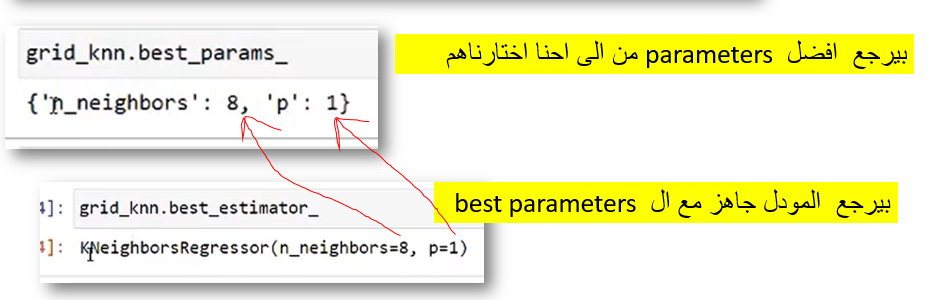

In [166]:
rand_serch_cv_random_forest.best_params_

{'n_estimators': 400, 'max_samples': 0.8, 'max_depth': 18}

In [171]:
random_for_reg_best = rand_serch_cv_random_forest.best_estimator_ 
# == random_for_reg_best = RandomForestRegressor('n_estimators': 400, 'max_samples': 0.8, 'max_depth': 18)
random_for_reg_best

RandomForestRegressor(max_depth=18, max_samples=0.8, n_estimators=400,
                      random_state=42)

In [38]:
# pip install xgboost

In [ ]:
# import xfgboost as xgb
# xgb_reg = xgb.XGBRegressor()

In [80]:
from xgboost import XGBRegressor
xgb_reg = XGBRegressor()

In [43]:
# from sklearn.datasets import load_diabetes
# from sklearn.metrics import mean_absolute_error
# X, y = load_diabetes(return_X_y=True)
# reg = xgb.XGBRegressor(
#     tree_method="hist",
#     eval_metric=mean_absolute_error,
# )
# reg.fit(X, y, eval_set=[(X, y)])

In [45]:
# from sklearn.datasets import load_breast_cancer
# from sklearn.model_selection import train_test_split

# import xgboost as xgb

# X, y = load_breast_cancer(return_X_y=True)
# X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=94)

# # Use "hist" for constructing the trees, with early stopping enabled.
# clf = xgb.XGBClassifier(tree_method="hist", early_stopping_rounds=2)
# # Fit the model, test sets are used for early stopping.
# clf.fit(X_train, y_train, eval_set=[(X_test, y_test)])
# # Save model into JSON format.
# clf.save_model("clf.json")

In [82]:
xgb_reg = XGBRegressor(n_estimators= 100,  max_depth = 6 , learning_rate= 0.1, subsample = 0.8)

In [100]:
xgb_reg_score = cross_val_score(estimator=xgb_reg, X= X_train_final, y = y_train,  cv=5,
                            scoring='neg_mean_squared_error', n_jobs=-1 )
RMSE_xgb_reg_score = np.sqrt(xgb_reg_score*-1).mean()
RMSE_xgb_reg_score

47311.55295336342

In [101]:
y_xgb_reg = cross_val_predict(estimator=xgb_reg, X= X_train_final, y = y_train,  cv=5,
                           n_jobs=-1, method='predict')
RMSE_xgb_reg_pred  = np.sqrt(mean_squared_error(y_train, y_xgb_reg ))
RMSE_xgb_reg_pred

47321.46239876797

In [135]:
dff = pd.DataFrame(y_train)
dfff = pd.DataFrame(y_xgb_reg)

dff , dfff

(       median_house_value
 4602             275000.0
 6978             238500.0
 16415            158300.0
 2549              70500.0
 11025            222300.0
 ...                   ...
 11284            229200.0
 11964             97800.0
 5390             222100.0
 860              283500.0
 15795            325000.0
 
 [17544 rows x 1 columns],
                    0
 0      187615.671875
 1      205703.828125
 2      130611.671875
 3       70535.914062
 4      170057.125000
 ...              ...
 17539  314557.750000
 17540  123669.921875
 17541  216921.828125
 17542  276593.062500
 17543  339175.062500
 
 [17544 rows x 1 columns])

In [133]:
print(f' ypredict_ xgb using cross_val is       {y_xgb_reg[1]} ')

print(f' real y  is                        {y_train[4602]} ') # 1st y after suffiling 

 ypredict_ xgb using cross_val is       205703.828125 
 real y  is                        275000.0 


In [78]:
xgb_reg_param = {'n_estimators':np.arange(100, 500, 100),
                 'max_depth':np.arange(4,20,2) ,
                 'learning_rate': [0.1, 0.2],
                 'subsample': [0.8, 0.9]}
rand_serch_cv_xgb = RandomizedSearchCV(estimator=xgb_reg, param_distributions=xgb_reg_param,
                                 n_iter = 20, scoring='neg_mean_squared_error', cv =5, verbose=42 ,
                                       random_state=42 )


NameError: name 'xgb_reg' is not defined

In [115]:
rand_serch_cv_xgb.fit(X_train_final, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV 1/5; 1/20] START learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9
[CV 1/5; 1/20] END learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9;, score=-2389954803.253 total time=  24.2s
[CV 2/5; 1/20] START learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9
[CV 2/5; 1/20] END learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9;, score=-2605691266.991 total time=  24.2s
[CV 3/5; 1/20] START learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9
[CV 3/5; 1/20] END learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9;, score=-2576225031.958 total time=  25.1s
[CV 4/5; 1/20] START learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9
[CV 4/5; 1/20] END learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9;, score=-2346976916.860 total time=  29.0s
[CV 5/5; 1/20] START learning_rate=0.1, max_depth=16, n_estimators=400, subsample=0.9


[CV 4/5; 8/20] END learning_rate=0.2, max_depth=14, n_estimators=100, subsample=0.8;, score=-2369641287.046 total time=   4.9s
[CV 5/5; 8/20] START learning_rate=0.2, max_depth=14, n_estimators=100, subsample=0.8
[CV 5/5; 8/20] END learning_rate=0.2, max_depth=14, n_estimators=100, subsample=0.8;, score=-2501155931.508 total time=   4.8s
[CV 1/5; 9/20] START learning_rate=0.2, max_depth=8, n_estimators=100, subsample=0.9
[CV 1/5; 9/20] END learning_rate=0.2, max_depth=8, n_estimators=100, subsample=0.9;, score=-2131960822.940 total time=   0.5s
[CV 2/5; 9/20] START learning_rate=0.2, max_depth=8, n_estimators=100, subsample=0.9
[CV 2/5; 9/20] END learning_rate=0.2, max_depth=8, n_estimators=100, subsample=0.9;, score=-2321013974.713 total time=   0.6s
[CV 3/5; 9/20] START learning_rate=0.2, max_depth=8, n_estimators=100, subsample=0.9
[CV 3/5; 9/20] END learning_rate=0.2, max_depth=8, n_estimators=100, subsample=0.9;, score=-2312378160.559 total time=   0.5s
[CV 4/5; 9/20] START learni

[CV 3/5; 16/20] END learning_rate=0.2, max_depth=16, n_estimators=100, subsample=0.9;, score=-2644298834.398 total time=   9.5s
[CV 4/5; 16/20] START learning_rate=0.2, max_depth=16, n_estimators=100, subsample=0.9
[CV 4/5; 16/20] END learning_rate=0.2, max_depth=16, n_estimators=100, subsample=0.9;, score=-2436958588.113 total time=   9.7s
[CV 5/5; 16/20] START learning_rate=0.2, max_depth=16, n_estimators=100, subsample=0.9
[CV 5/5; 16/20] END learning_rate=0.2, max_depth=16, n_estimators=100, subsample=0.9;, score=-2521765660.392 total time=   9.8s
[CV 1/5; 17/20] START learning_rate=0.1, max_depth=12, n_estimators=300, subsample=0.8
[CV 1/5; 17/20] END learning_rate=0.1, max_depth=12, n_estimators=300, subsample=0.8;, score=-2156018281.265 total time=  10.0s
[CV 2/5; 17/20] START learning_rate=0.1, max_depth=12, n_estimators=300, subsample=0.8
[CV 2/5; 17/20] END learning_rate=0.1, max_depth=12, n_estimators=300, subsample=0.8;, score=-2392478895.042 total time=  11.6s
[CV 3/5; 17/

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None, n_estimators=100,
                                          n_jobs=None, num_parallel_tree=None,
                                          random_state=None, ...),
                   n_iter=20,
                   param_distributions={'learning_rate': [0.1, 0.2],
                                        'max_depth': array([ 4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([100, 200, 300, 400]),
                                        'subsample': [0.8, 0.9]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=42)

In [116]:
rand_serch_cv_xgb.best_params_

{'subsample': 0.9, 'n_estimators': 200, 'max_depth': 8, 'learning_rate': 0.1}

In [117]:
best_xgboost = rand_serch_cv_xgb.best_estimator_

In [77]:
best_xgboost.fit(X_train_final, y_train)

NameError: name 'best_xgboost' is not defined

In [114]:
xgb_reg_best_param = XGBRegressor(n_estimators= 200,  max_depth = 8 ,
                                  learning_rate= 0.1, subsample = 0.9)

In [124]:
xgb_reg_best_param.fit(X_train_final, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=8, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [115]:
xgb_reg_score = cross_val_score(estimator=xgb_reg_best_param , X= X_train_final, y = y_train,  cv=5,
                            scoring='neg_mean_squared_error', n_jobs=-1 )
RMSE_xgb_reg_score = np.sqrt(xgb_reg_score*-1).mean()
RMSE_xgb_reg_score

45963.7721815141

In [116]:
y_best_xgb_reg = cross_val_predict(estimator=xgb_reg_best_param, X= X_train_final, y = y_train,  cv=5,
                           n_jobs=-1, method='predict')
RMSE_best_xgb_reg_pred  = np.sqrt(mean_squared_error(y_train, y_best_xgb_reg ))
RMSE_best_xgb_reg_pred

45974.22626042219

In [117]:
print(f' ypredict_ xgb using cross_val is       {y_best_xgb_reg[1]} ')

print(f' real y  is                        {y_train[4602]} ') # 1st y after suffiling 

 ypredict_ xgb using cross_val is       203532.875 
 real y  is                        275000.0 


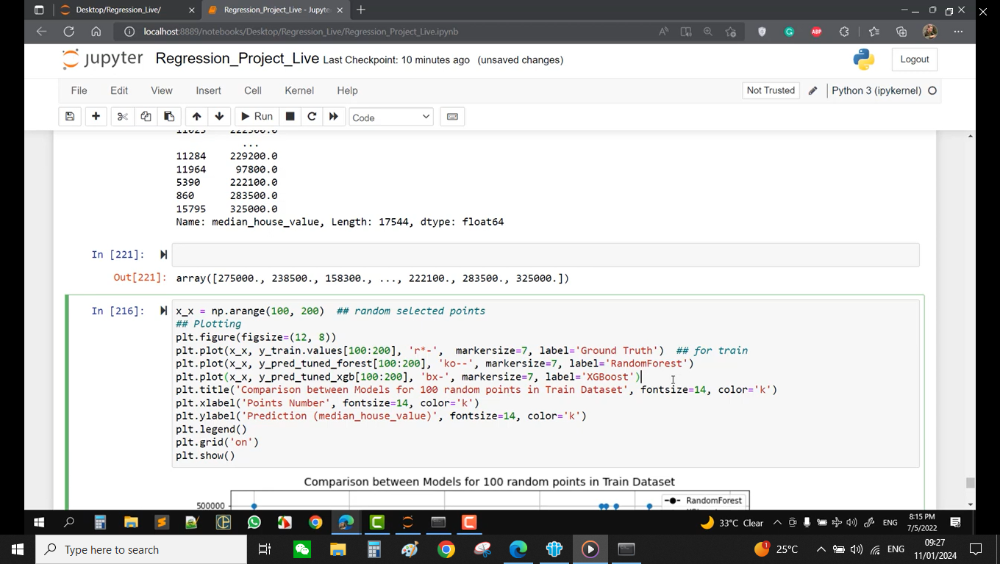

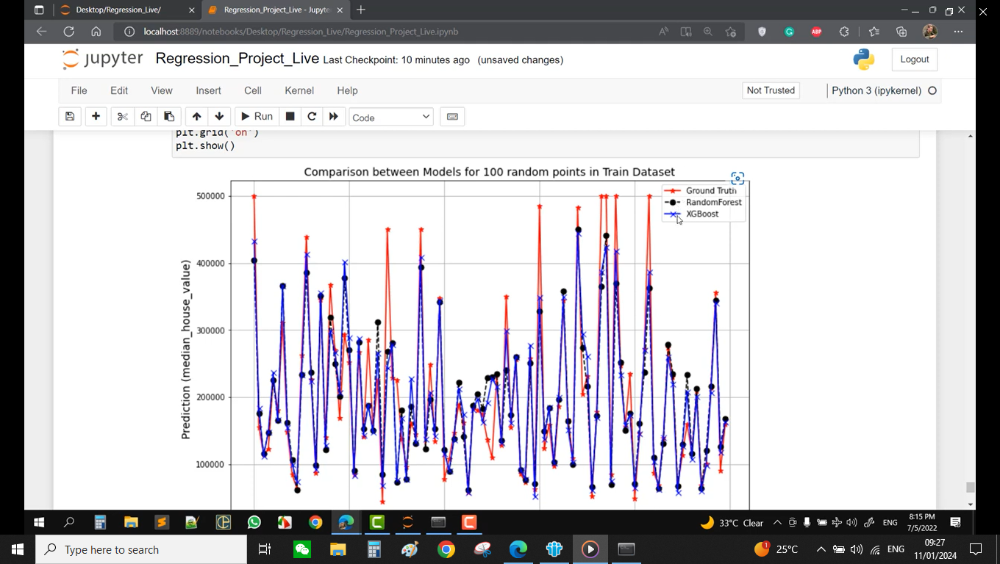

# down load the best model

In [118]:
# pip install joblib

In [126]:
import joblib

In [127]:
# to download the model using the joblib
#joblib.dump(the model name as note book, 'the name that you choose to save in you pc .pkl')
joblib.dump(xgb_reg_best_param, 'model_xgboost.pkl')

['model_xgboost.pkl']

# you will find the model is saved in the same folder you are working on 

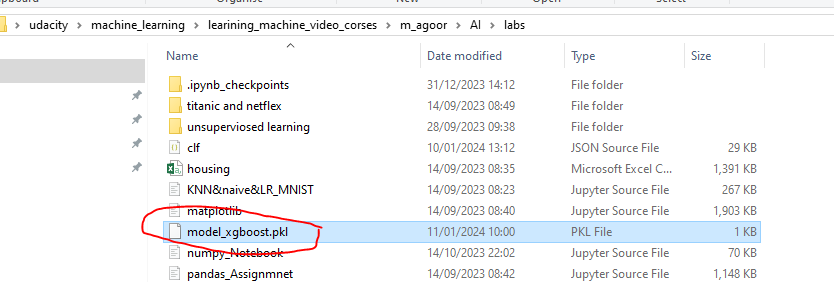

In [128]:
# to upload the model using joblib.load('the model name . pkl')
loaded_model = joblib.load('model_xgboost.pkl')
loaded_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=8, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [129]:
y_pred_test = loaded_model.predict(X_test_final)

In [131]:
RMSE_loaded_model = np.sqrt(mean_squared_error(y_test,y_pred_test ))
RMSE_loaded_model

45143.80411259132